<a href="https://colab.research.google.com/github/OlegBEZb/Haemodynamic-Response-Mapper/blob/main/HRM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Exploring the haemodynamic response function(s) in the visual cortex with 7T data
*(Project 3: Haemodynamic Response Mapper)*



# Analysis

In the following, we will first present our entire analysis step by step. This includes some parts of the project notebook provided. The analysis is followed by a compact report containing the introduction, the methodology, the core results found, and a discussion of them.

# Installations and imports



In [1]:
# this cell installs some dependencies. 
# feel free to disregard the output this generates

!apt -qq install inkscape > /dev/null
!pip -qq install nibabel nilearn
!pip -qq install git+https://github.com/gallantlab/pycortex.git#egg=pycortex



Extracting templates from packages: 100%
     |████████████████████████████████| 10.1 MB 4.5 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done


In [2]:
# after these basic installs, we can import our required packages. 

from copy import deepcopy

import numpy as np
import scipy as sp
import nibabel as nb
import nilearn as nl
from nilearn.surface import load_surf_data
import os, shutil, urllib.request
import cortex as cx

from scipy.signal import periodogram
# from scipy.ndimage import gaussian_filter
from scipy.ndimage import gaussian_filter1d
from scipy import stats

from matplotlib import rc
import matplotlib.patches as mpatches
rc('animation', html='jshtml')

import matplotlib.pyplot as plt
%matplotlib inline 

# Utilities

In this section, some often used functions are collected.

In [3]:
def fit_glm(X, y):
    betas, residuals, rank, singular_values = np.linalg.lstsq(X, y.T, rcond=-1)

    y_hat = np.dot(betas.T, X.T)
    rsq = 1-(y_hat-y).var(1)/y.var(1)
    mse = ((y - y_hat)**2).mean()
    
    return betas, rsq, y_hat, mse

In [4]:
def matprint(mat, fmt="g"):
    # func for pretty printing numpy matrix
    # https://gist.github.com/braingineer/d801735dac07ff3ac4d746e1f218ab75
    col_maxes = [max([len(("{:" + fmt + "}").format(x)) for x in col]) for col in mat.T]
    for x in mat:
        for i, y in enumerate(x):
            print(("{:" + str(col_maxes[i]) + fmt + "}").format(y), end="  ")
        print("")

In [5]:
def add_events_FIR(event_trs, data_duration=None, dm=None, n_timepoints=20):
    if data_duration is None:
        try:
            data_duration = dm.shape[0]
        except:
            raise ValueError('data_duration or dm have to be provided')
    
    dm_one_event = np.eye(n_timepoints)   
    event_dm = np.zeros((data_duration, n_timepoints))
    for event_tr in event_trs:
        event_dm[event_tr:event_tr + n_timepoints, :] += dm_one_event

    if dm is None:
        return event_dm
    else:
        return np.hstack((dm, event_dm))

In [6]:
def plot_dm(dm):
    fig, ax = plt.subplots(2, 1, figsize=(12, 6), gridspec_kw={'height_ratios': [1, 3]})

    ax[0].imshow(dm.T, aspect='auto')
    ax[0].set_title('multiple-event FIR design matrix')
    ax[0].set_ylabel('regressor')

    summed_dm = dm.sum(1)

    ax[1].plot(summed_dm, 'k--')
    ax[1].set_title('summed regressors')
    ax[1].set_xlabel('timepoint in experiment')
    ax[1].set_xlim([0, dm.shape[0]])
    
    plt.tight_layout()

In [7]:
def get_best_indices_mask(rsq, region_mask, top_n):
    rsq = deepcopy(rsq)
    # replace non-used region values
    rsq[~region_mask] = np.nanmin(rsq) - 1 
    
    # https://stackoverflow.com/questions/6910641/how-do-i-get-indices-of-n-maximum-values-in-a-numpy-array 
    best_rsq_indices = np.argpartition(rsq, -top_n)[-top_n:]

    mask = np.zeros(rsq.shape[0], bool)
    mask[best_rsq_indices] = True

    return mask, best_rsq_indices

In [8]:
def plot_responsive_vertex(rsq, betas, mask, betas_n=0, n_timepoints=20, xlabel = 'time [s]',
                           **plot_kwargs):
    rsq_mask = rsq[mask]
    responsive_vertex_FIR_timecourses = betas[1 + n_timepoints*betas_n: 1 + n_timepoints*(betas_n+1), # coefficient (excl intercept (0-th)) 
                                              mask]
    # how many?
    print(f'{responsive_vertex_FIR_timecourses.shape[1]} responsive voxels detected in the region')

    for i, tc in enumerate(responsive_vertex_FIR_timecourses.T):
        plt.plot(np.arange(n_timepoints)*tr, tc, alpha=rsq_mask[i], **plot_kwargs);
    plt.xlabel(xlabel)
    plt.ylabel('% signal change');


def plot_responsive_vertex_all(rsq, betas, mask, n_timepoints=20, xlabel = 'time [s]'):
    plot_responsive_vertex(rsq, betas, mask, betas_n=0, n_timepoints=n_timepoints, c='k', lw=0.25, xlabel = xlabel)
    plot_responsive_vertex(rsq, betas, mask, betas_n=1, n_timepoints=n_timepoints, c='r', lw=0.25, xlabel = xlabel)
    plot_responsive_vertex(rsq, betas, mask, betas_n=2, n_timepoints=n_timepoints, c='b', lw=0.25, xlabel = xlabel)

    legend_dict = { 'stimulus' : 'k', 'blinks' : 'r', 'saccades' : 'b' }
    patchList = []
    for key in legend_dict:
        data_key = mpatches.Patch(color=legend_dict[key], label=key)
        patchList.append(data_key)
    plt.legend(handles=patchList);

In [9]:
def plot_time_course(response_ts_dict, events_dict):

    from itertools import cycle
    cycol = cycle(['tab:blue', 'tab:orange', 'tab:red', 'tab:green', 'tab:purple'])
    plt.figure(figsize=(12, 4))

    for event_i, item in enumerate(events_dict.items()):
        col = next(cycol)

        event_name, event_trs = item

        plt.subplot(len(events_dict)+1, 1, event_i+1)    
        random_stim_vector = np.zeros(len(list(response_ts_dict.values())[0]))
        random_stim_vector[event_trs] = 1
        for i, event in enumerate(random_stim_vector):
            if event != 0.0:
                plt.plot((i, i), (0, 1), 'k-', c=col)
        plt.title(event_name, fontsize=18)
    plt.tight_layout()

    plt.figure(figsize=(12, 4))
    for response_ts in response_ts_dict.values():
        col = next(cycol)
        plt.plot(response_ts, lw=1, c=col)
    plt.legend(response_ts_dict.keys(), fontsize=10)
    plt.title("response", fontsize=18)

    plt.tight_layout()

In [10]:
def plot_response_time_course(response_matrix, percentile=0.975, ts_name="V1"):
    voxels_num, trs_num = response_matrix.shape

    mean_signal = response_matrix.mean(axis=0)
    std_signal = response_matrix.std(axis=0) #for every single timepoint

    tq = stats.t(df=voxels_num - 1).ppf(percentile) # lets do it super exactly ;)
    error = tq * (std_signal/np.sqrt(voxels_num))

    plt.figure(figsize=(14, 5))
    plt.plot(mean_signal)

    x = np.arange(0, trs_num)
    plt.fill_between(x, (mean_signal-error), (mean_signal+error), color='grey', alpha=0.3)
    
    plt.xlabel("Time (TR)", fontsize=20)
    plt.ylabel("Activity", fontsize=20)
    plt.title(f"Global signal (i.e., average across all voxels) in {ts_name}", fontsize=25)
    plt.xlim(0, 450)
    plt.show()

In [11]:
def adjust_lightness(color, amount=0.5):
    # https://stackoverflow.com/questions/37765197/darken-or-lighten-a-color-in-matplotlib
    import matplotlib.colors as mc
    import colorsys
    try:
        c = mc.cnames[color]
    except:
        c = color
    c = colorsys.rgb_to_hls(*mc.to_rgb(c))
    return colorsys.hls_to_rgb(c[0], max(0, min(1, amount * c[1])), c[2])


def plot_responsive_vertex_time_course(betas, mask, betas_n=0, n_timepoints=20,
                                       percentile=0.975, **plot_kwargs):

    responsive_vertex_FIR_timecourses = betas[1 + n_timepoints*betas_n: 1 + n_timepoints*(betas_n+1), # coefficient (excl intercept (0-th))
                                              mask].T

    voxels_num, trs_num = responsive_vertex_FIR_timecourses.shape

    mean_signal = responsive_vertex_FIR_timecourses.mean(axis=0)
    std_signal = responsive_vertex_FIR_timecourses.std(axis=0) #for every single timepoint

    tq = stats.t(df=voxels_num - 1).ppf(percentile) # lets do it super exactly ;)
    error = tq * (std_signal/np.sqrt(voxels_num))

    plt.plot(mean_signal, **plot_kwargs)

    if 'color' in plot_kwargs:
        dark_color = adjust_lightness(plot_kwargs['color'], 0.9)
    else:
        dark_color = 'grey'

    x = np.arange(0, trs_num)
    plt.fill_between(x, (mean_signal-error), (mean_signal+error),
                     color=dark_color, alpha=0.3)


def plot_responsive_vertex_time_course_all(betas, mask, n_timepoints=20, percentile=0.975):
    """
    Example:
    >>> plt.figure(figsize=(14, 5))
    >>> plot_responsive_vertex_time_course_all(betas, roi_boolean_mask_V1,
                                        n_timepoints=20, percentile=0.975)
    >>> plt.xlabel("Time (TR)", fontsize=20)
    >>> plt.ylabel("Activity", fontsize=20)
    >>> plt.title("Response signal in V1", fontsize=25);
    """
    for betas_n, color in zip([0, 1, 2], ['k', 'r', 'b']):
        plot_responsive_vertex_time_course(betas, mask, betas_n=betas_n,
                                        n_timepoints=n_timepoints,
                                        percentile=percentile, color=color)

    legend_dict = { 'stimulus' : 'k', 'blinks' : 'r', 'saccades' : 'b' }
    patchList = []
    for key in legend_dict:
        data_key = mpatches.Patch(color=legend_dict[key], label=key)
        patchList.append(data_key)
    plt.legend(handles=patchList);


In [12]:
def design_variance(X, which_predictor=1):
    ''' Returns the design variance of a predictor (or contrast) in X.
    
    Parameters
    ----------
    X : numpy array
        Array of shape (N, P)
    which_predictor : int or list/array
        The index of the predictor you want the design var from.
        Note that 0 refers to the intercept!
        Alternatively, "which_predictor" can be a contrast-vector
        (which will be discussed later this lab).
        
    Returns
    -------
    des_var : float
        Design variance of the specified predictor/contrast from X.
    '''
    
    is_single = isinstance(which_predictor, int)
    if is_single:
        idx = which_predictor
    else:
        idx = np.array(which_predictor) != 0
    
    c = np.zeros(X.shape[1])
    c[idx] = 1 if is_single == 1 else which_predictor[idx]
    des_var = c.dot(np.linalg.pinv(X.T.dot(X))).dot(c.T)
    return des_var

# Download of data: surfaces for plotting and project data

Both the surface data we'll use for visualization and the project fMRI data are on figshare. From Figshare, we can download the data and place them in the Colab virtual machine.

In [13]:
#
# this cell ensures that we can work with our own surface from within the colab environment
#

os.makedirs('/content/pycortex/db', exist_ok=True)
os.makedirs('/content/pycortex/colormaps', exist_ok=True)
os.makedirs('/content/data', exist_ok=True)

wrong_filestore_location = 'build/bdist.linux-x86_64/wheel/pycortex-1.3.0.dev0.data/data/share/pycortex/'
with open('/usr/local/lib/python3.7/dist-packages/cortex/defaults.cfg', 'r') as f:
  file_source = f.read()
replace_string = file_source.replace(wrong_filestore_location, '/content/pycortex/') #save output 
with open('/usr/local/lib/python3.7/dist-packages/cortex/defaults.cfg', 'w') as f:
  f.write(replace_string)   

os.chdir('/tmp/')
!git clone https://github.com/gallantlab/pycortex.git
!cp /tmp/pycortex/filestore/colormaps/* /content/pycortex/colormaps/

#
# and we'll download our average hcp subject for pycortex visualization
#

pycortex_sj_URL = "https://ndownloader.figshare.com/files/25768841"

urllib.request.urlretrieve(pycortex_sj_URL, os.path.join('/content/pycortex/db', 'hcp_999999.zip'))
!unzip -qq /content/pycortex/db/hcp_999999.zip -d /usr/share/pycortex/db/

#
# and then download the projects' data from figshare
#

timeseries_data_URL = 'https://ndownloader.figshare.com/articles/14096209/versions/3'
urllib.request.urlretrieve(timeseries_data_URL, os.path.join('/content/data', '14096209.zip'))
!unzip -qq /content/data/14096209.zip -d /content/data/
!unzip -qq /content/data/hrf_mapper_59k.zip -d /content/data/hrf_mapper_59k/
# !unzip -qq /content/data/prf_mapper_59k.zip -d /content/data/prf_mapper_59k/
# !unzip -qq /content/data/soma_mapper_59k.zip -d /content/data/soma_mapper_59k/
!unzip -qq /content/data/atlas.zip -d /content/data/

Cloning into 'pycortex'...
remote: Enumerating objects: 23889, done.
remote: Counting objects: 100% (2293/2293), done.
remote: Compressing objects: 100% (785/785), done.
remote: Total 23889 (delta 1533), reused 2151 (delta 1449), pack-reused 21596
Receiving objects: 100% (23889/23889), 476.16 MiB | 22.92 MiB/s, done.
Resolving deltas: 100% (18215/18215), done.


# Data description
The data were acquired at the 7T scanner at the Spinoza Centre for Neuroimaging, Amsterdam. All data are resampled to the 59k HCP surface format.

On [figshare](https://figshare.com/articles/dataset/fMRI_Teaching_Materials/14096209) we get the following information: An HRF mapper (TR 0.945s, 2mm iso), consisting of a single run of 63 presentations of a full-field checkerboard visual stimulus. There is additional data for this single run dataset: eye tracking (saccade and blink onset times), and fmriprep confound outputs. This allows the deconvolution of impulse-response functions from the BOLD data.

### Flatmaps

The cortical surface or ribbon is topologically a ball per hemisphere. That is, each hemisphere can be inflated to the shape of a sphere. Flatmaps are created by cutting the inflated cortical surface at specific locations (see the black lines in the left figure), and then letting the computer flatten the resulting mesh into a planar surface. This representation will be used in the following. 

<img src="https://github.com/VU-Cog-Sci/wiki/raw/master/imgs/flatten/image9.png" alt="where do we cut the surface" width="45%" style="align:left;"/> <img src="https://universe-review.ca/I10-13-BrainMap3.jpg" alt="Visual, auditory and somatosensory brain regions" width="45%" style="align:right;"/>



# Loading the functional data for your project


In [14]:
# Here, I'm using python's awesome f-string functionality to load the data in a structured way across hemisperes. 
# Once the data have been loaded (for plotting and stuff), we don't have to care about hemispheres so much anymore. 

#########################################################################################################
###############
############### hrf mapping data
###############
#########################################################################################################

tseries_raw = np.concatenate([load_surf_data(
         os.path.join('/content/data/hrf_mapper_59k', f'sub-012_ses-2_task-hrfmapper_run-1_bold_space-T1w_preproc_59k.{hemi}.dtseries.gii'))
          for hemi in ['L', 'R']])


# and, we'll check the shape of the data to see whether things make sense
# data should be shaped as vertices by timepoints, and each hemisphere is 59k vertices - hence the name :) 
print(tseries_raw.shape)

(118584, 440)


#Raw Data Observations and Preprocessing


If the signals have been filtered already, there should be no drifts in the data. Also, if the data time-courses have already been z-scored or converted to percent signal change, the mean of the signals should already be 0. If the data are in 'units' of % signal change, the maximal excursions of the signal timecourse will be on the order of 10-20. If they've been z-scored, their standard deviation should be exactly 1 (duh!). 

Generating a flatmap cache
Failed to get connection
** (inkscape:3190): CRITICAL **: 20:59:49.075: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3190): CRITICAL **: 20:59:49.075: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3190): CRITICAL **: 20:59:49.075: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed
Failed to get connection
** (inkscape:3193): CRITICAL **: 20:59:50.563: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3193): CRITICAL **: 20:59:50.563: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3193): CRITICAL **: 20:59:50.563: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


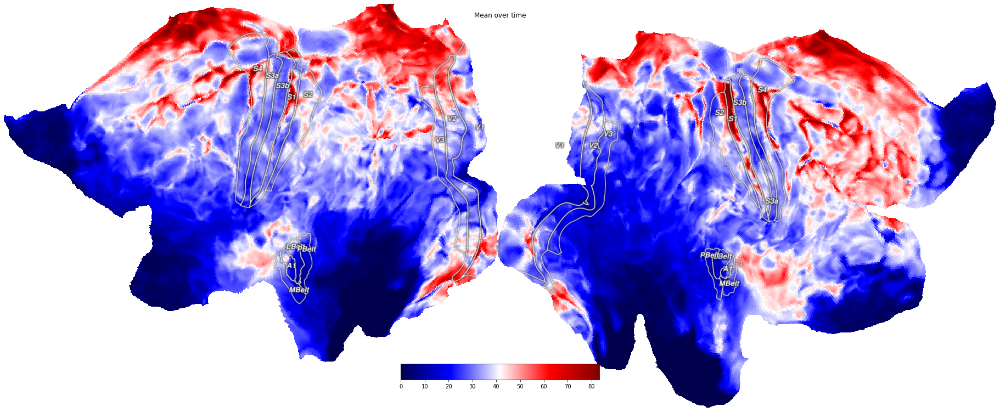

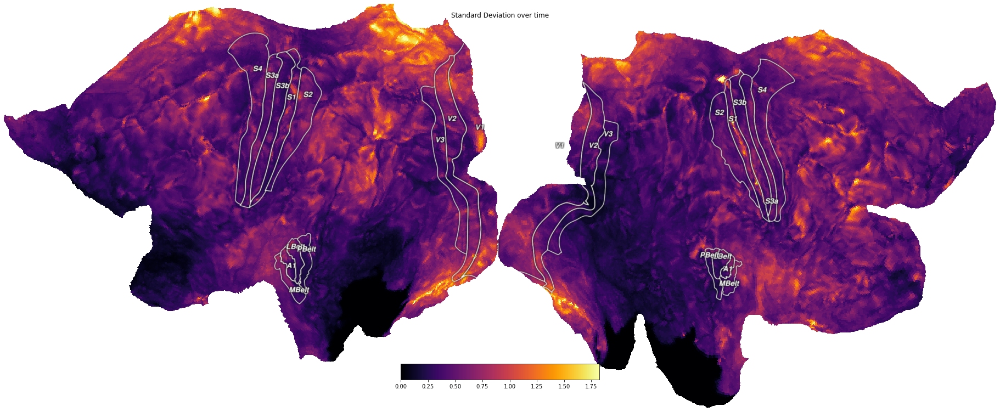

In [15]:
# Note that we saw in the cell above that the second dimension is time, 
# so the axis on which we take the mean and standard deviation is 1
f = cx.quickshow(cx.Vertex(tseries_raw.mean(axis=1), subject='hcp_999999', cmap='seismic'));
f.suptitle('Mean over time')

f = cx.quickshow(cx.Vertex(tseries_raw.std(axis=1), subject='hcp_999999', cmap='inferno'));
f.suptitle('Standard Deviation over time');

## Check for drifts

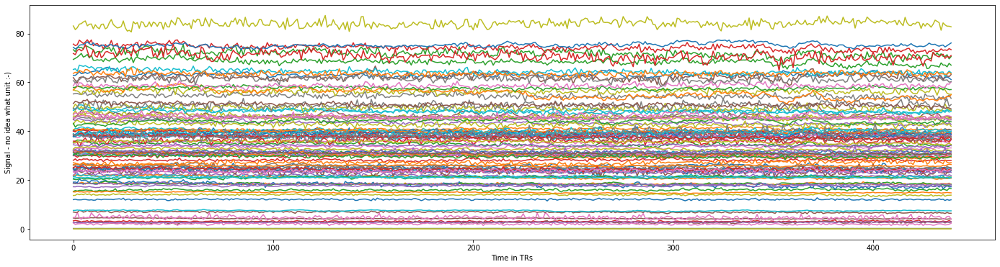

In [16]:
# now, let's get some random time-courses to check whether there's still drift:
random_vertices = np.random.choice(np.arange(tseries_raw.shape[0]), 100)
f = plt.figure(figsize=(24,6))
plt.plot(tseries_raw[random_vertices].T)
plt.xlabel('Time in TRs')
plt.ylabel('Signal - no idea what unit :-)');

In [17]:
# From the data description we know the TR
TR = 0.945

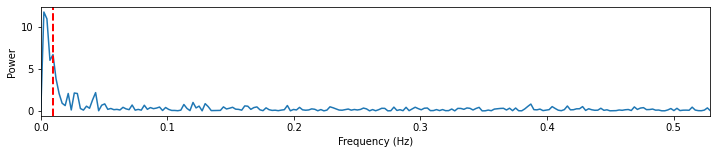

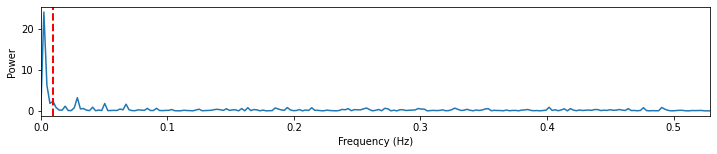

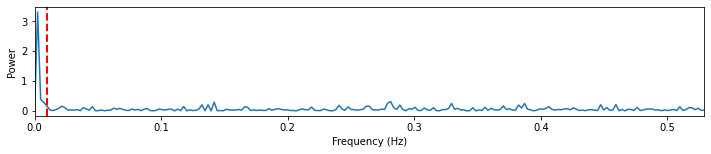

In [18]:
# Following preprocessing steps from tutorial.
# (1) checking in frequency domain for slow drift (FT).
sampling_frequency = 1 / TR  # sampling rate aka frequency

random_vertices = np.random.choice(np.arange(tseries_raw.shape[0]), 3)

for rand_id in random_vertices:
    freqs, pows = periodogram(tseries_raw[rand_id], fs=sampling_frequency) #2nd arg is sampling rate
    plt.figure(figsize=(12, 2))
    plt.plot(freqs, pows)
    plt.xlim(0, freqs.max())
    plt.ylabel('Power')
    plt.xlabel('Frequency (Hz)')

    # There is no guideline on how to choose the cutoff of your high-pass filter, 
    # but most recommend to use a cutoff of 100 seconds (i.e., of 0.01 Hz). 
    # This means that any oscillation slower than 100 seconds (one cycle in 100 seconds) 
    # is removed from your signal.
    plt.axvline(x=0.01,color='r',ls='dashed', lw=2)

Obviosly, some of the voxels have a slow drift. These components can be removed through high-pass filtering of the data. For this, we selected 0.01 Hz as cut-off value.

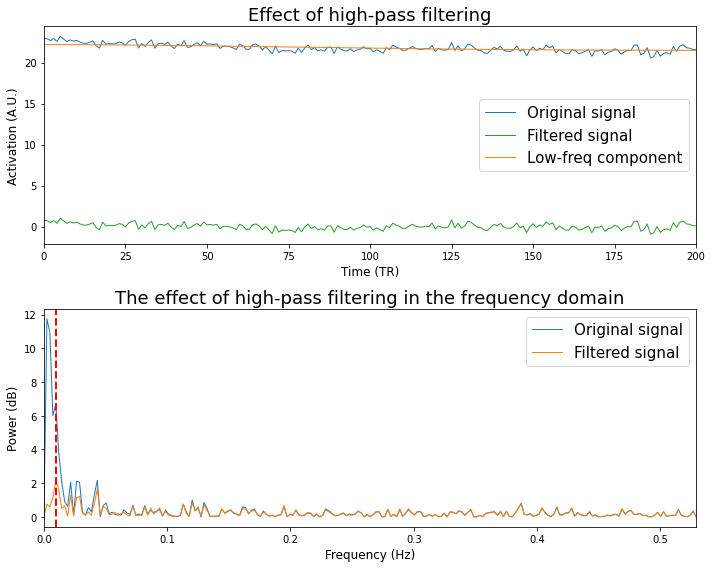

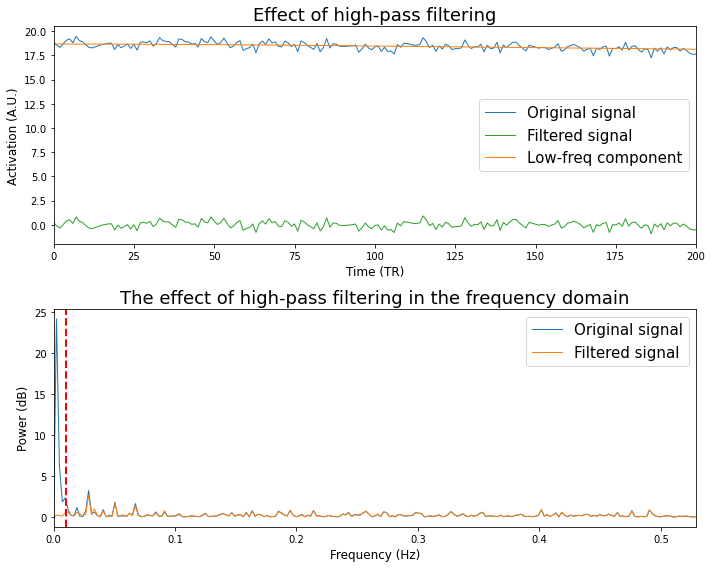

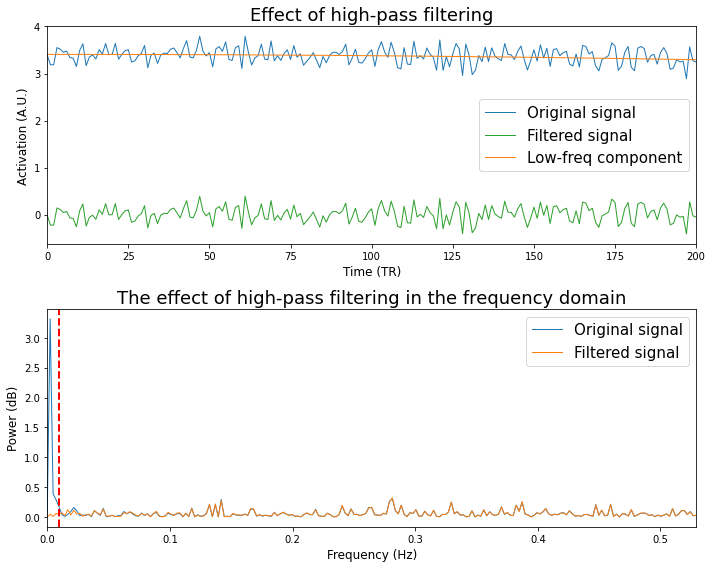

In [19]:
# There is no guideline on how to choose the cutoff of your high-pass filter, 
# but most recommend to use a cutoff of 100 seconds (i.e., of 0.01 Hz). 
# This means that any oscillation slower than 100 seconds (one cycle in 100 seconds) 
# is removed from your signal.
sigma_hp = 100 / (2 * TR) #cuttof(sec)/2*TR(sec)

# filt = gaussian_filter(tseries_raw, sigma_hp) #this will return the low freq component
filt = gaussian_filter1d(tseries_raw, sigma_hp, axis=1)
tseries_filtered = tseries_raw - filt # we still need to subtract it from our voxel signal
#i could plot signal before and after high pass filtering to see if it worked?
#or could also check mse to see if fit became better!?


#checking periodogram to see results of high pass filtering- on the same timecourses plotted above!
for rand_id in random_vertices:
    raw = tseries_raw[rand_id]
    new = tseries_filtered[rand_id]
    low_freq_comp = filt[rand_id]

    plt.figure(figsize=(10, 8))

    plt.subplot(2, 1, 1)
    plt.plot(raw, lw=1)
    plt.plot(new, lw=1, c='tab:green')
    plt.plot(low_freq_comp, lw=1)
    plt.xlim(0, 200)
    plt.legend(['Original signal', 'Filtered signal', 'Low-freq component'], fontsize=15)
    plt.title("Effect of high-pass filtering", fontsize=18)
    plt.xlabel("Time (TR)", fontsize=12)
    plt.ylabel("Activation (A.U.)", fontsize=12)


    plt.subplot(2, 1, 2)
    freq_raw, power = periodogram(raw, fs=sampling_frequency)
    plt.plot(freq_raw, power, lw=1)

    freq_new, power = periodogram(new, fs=sampling_frequency)
    plt.plot(freq_new, power, lw=1)
    assert freq_raw.max() == freq_new.max()
    plt.xlim(0, freq_new.max())
    plt.ylabel('Power (dB)', fontsize=12)
    plt.xlabel('Frequency (Hz)', fontsize=12)
    plt.title("The effect of high-pass filtering in the frequency domain", fontsize=18)
    plt.legend(["Original signal", "Filtered signal"], fontsize=15)

    plt.axvline(x=0.01, color='r', ls='dashed', lw=2)
    plt.tight_layout()
    plt.show()

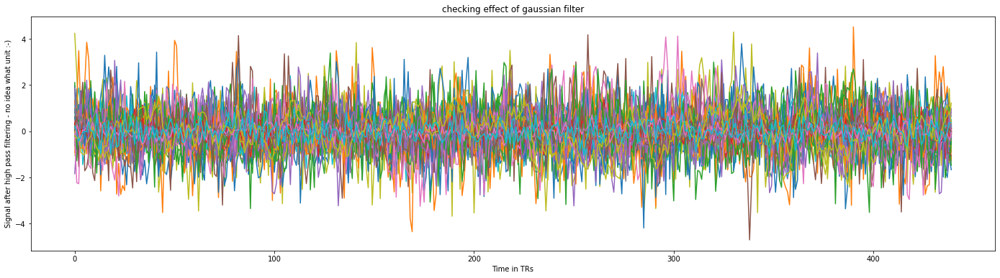

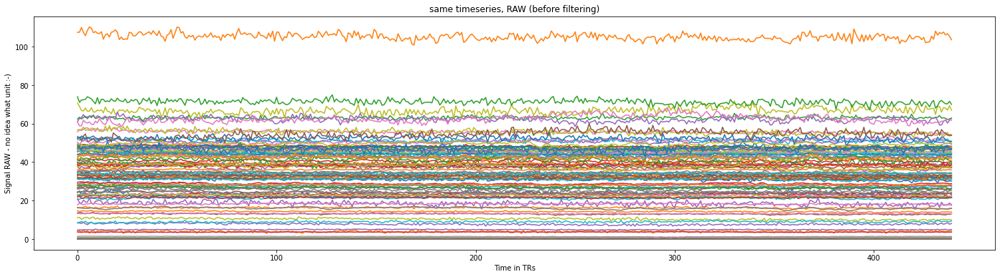

In [20]:
#plotting the same timeseries raw and after high pass giltering to see the effect of high pass filtering on timecourses (in time domain)

random_vertices = np.random.choice(np.arange(tseries_filtered.shape[0]), 100)
#ax = plt.subplot(111))
f = plt.figure(figsize=(24,6))
plt.plot(tseries_filtered[random_vertices].T)
plt.title('checking effect of gaussian filter')
plt.xlabel('Time in TRs')
plt.ylabel('Signal after high pass filtering - no idea what unit :-)');
#plt.show()

f2 = plt.figure(figsize=(24,6))
plt.plot(tseries_raw[random_vertices].T)
plt.title('same timeseries, RAW (before filtering)')
plt.xlabel('Time in TRs')
plt.ylabel('Signal RAW - no idea what unit :-)');
#plt.show()

The data used obviously contains slow drift components. However, since slow drift regressors are to be added in the later tasks, we will continue to work with the unfiltered data in order to work out the differences in the HRF shape when accounting for it in task 2 compared to task 1.

## Spikes check

max std z_global_signal 3.0837169
max std z_global_signal_filtered 3.9874692


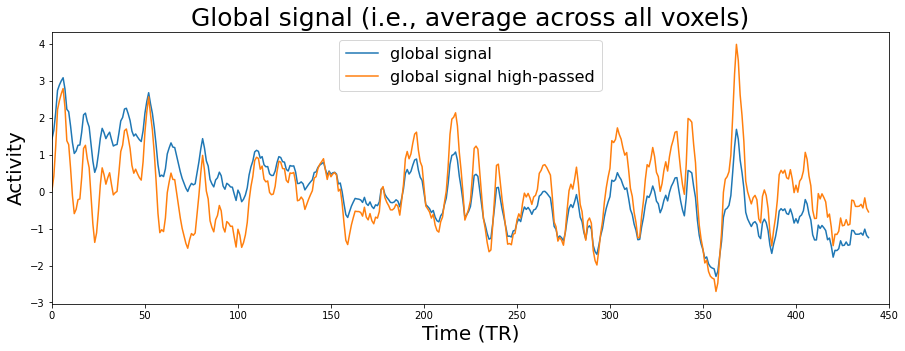

In [21]:
global_signal = tseries_raw.mean(axis = 0)
z_global_signal = (global_signal - global_signal.mean()) / global_signal.std()
print("max std z_global_signal", max(abs(z_global_signal)))
# max 3std away
# if we define 5 as border, than no time points to add as nuisance regressors

global_signal_filtered = tseries_filtered.mean(axis = 0)
z_global_signal_filtered = (global_signal_filtered - global_signal_filtered.mean()) / global_signal_filtered.std()
print("max std z_global_signal_filtered", max(abs(z_global_signal_filtered)))

plt.figure(figsize=(15, 5))
plt.plot(z_global_signal)
plt.plot(z_global_signal_filtered)
plt.xlabel("Time (TR)", fontsize=20)
plt.ylabel("Activity", fontsize=20)
plt.legend(['global signal', 'global signal high-passed'], fontsize=16)
plt.title("Global signal (i.e., average across all voxels)", fontsize=25)
plt.xlim(0, 450)
plt.show()

Since there are no spikes across total brain activity that exceed our threshold of 5 standard deviations in either the filtered or unfiltered data, we will not include corresponding regressors in the analysis for any time point.

## Percent signal change of data

The data are neither z-scored nor percent signal changed. In the following we will work with percent signal changed data unless specified differently.

In [22]:
# but let's look at the actual signals after percent signal change conversion. 
def psc(data):
  """take percent signal change of data along axis 1. 
  This implementation is a bit idiosyncratic since 
  it uses the median instead of the mean of the signal.
  For sparse signals with very strong activations (such as those at 7T)
  this approach makes sense. Can you imagine why?"""
  # crudely checking whether psc hasn't already happened, in which case do nothing
  if np.mean(data) < 0.5:
    return data
  return ((data.T/np.median(data, 1)).T - 1) * 100

# psc calculations can cause division by zero
tseries_psc = np.nan_to_num(psc(tseries_raw))

# psc calculations can cause division by zero
tseries_filtered_psc = np.nan_to_num(psc(tseries_filtered))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in true_divide
  # This is added back by InteractiveShellApp.init_path()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in true_divide
  # This is added back by InteractiveShellApp.init_path()


# Atlas tools

It's a very powerful thing to be able to plot stuff on the entire cerebral cortex in one go. But sometimes you want to focus on a single brain region. You can use your own methods to define regions of interest, for example using a separate mapper experiment that allows you to select voxels/vertices of interest - within which you'll then perform your analysis of interest. 

But we'll use the existing multi-modal parcelation atlas from the Human Connectome Project, from the [Glasser et al Nature study](https://www.nature.com/articles/nature18933) that was mentioned a couple of times in the lectures. This is the atlas shown in the right flatmap figure above, in the 'Flatmaps' section.

The following cells show how to select a given ROI's data - something that you may want to do quite a lot in your own analyses. It serves to zoom into a specific region of interest, but also means that you can 'pilot' time-consuming analyses on smaller amounts of data while still taking care to test your entire analysis. 

In [23]:
# we read in the atlas data, which consists of 180 separate regions per hemisphere. 
# These are labeled separately, so the labels go to 360. 
# To work with them in both hemispheres simultaneously, we mod by 180. 
atlas_data = np.concatenate([load_surf_data(
        os.path.join('/content/data/atlas', f'Q1-Q6_RelatedParcellation210.CorticalAreas_dil_Colors.59k_fs_LR.dlabel.{hemi}.gii'))
         for hemi in ['L', 'R']])
atlas_data_both_hemis = np.mod(atlas_data, 180)

In [24]:
unique, counts = np.unique(atlas_data_both_hemis, return_counts=True)

zipped = zip(unique, counts)
zipped = sorted(zipped, key = lambda x: x[1], reverse=True)

print('Largest regions')
for region, voxels in list(zipped)[:10]:
    print(f"region {region} has {voxels} voxels")

Largest regions
region 0 has 10421 voxels
region 1 has 2939 voxels
region 8 has 2852 voxels
region 4 has 2202 voxels
region 52 has 2024 voxels
region 9 has 2020 voxels
region 149 has 1736 voxels
region 51 has 1540 voxels
region 5 has 1472 voxels
region 131 has 1438 voxels


### Selecting an ROI

One can now easily use a test to create boolean arrays into a specific ROI. For example, we can check which ROI is indexed by the number 1. Make sure you understand what I did with the `vmin` and `vmax` settings of the `Vertex` object! You may be able to use these little tricks later!

In [25]:
vx = cx.Vertex(atlas_data_both_hemis == 1, subject='hcp_999999', cmap='hot', vmin=-0.3, vmax=2.1)
import pandas as pd
pd.Series(vx.data).value_counts()

False    115645
True       2939
dtype: int64

In [26]:
# min and max values in colormap
# f = cx.quickshow(cx.Vertex(atlas_data_both_hemis == 1, subject='hcp_999999', cmap='hot', vmin=-0.3, vmax=2.1));

This means we can also select those parts of the brain and single out the responses from just a single region of interest! That should be much more manageable.


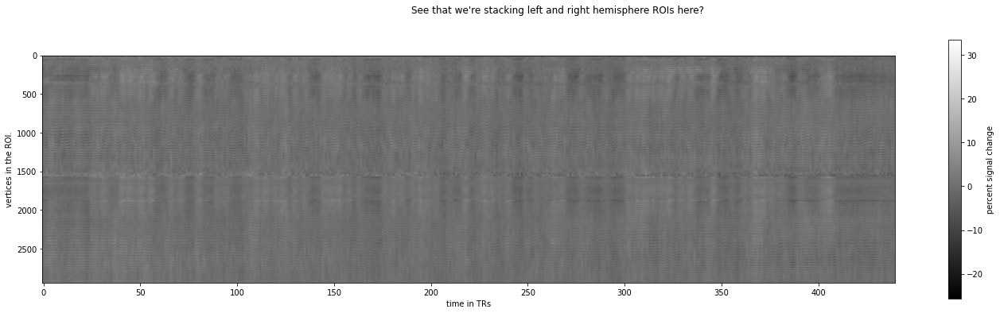

In [27]:
roi_boolean_mask = atlas_data_both_hemis == 1

f = plt.figure(figsize=(24, 6))
plt.imshow(psc(tseries_raw[roi_boolean_mask]), aspect=1/25, cmap='gray')
plt.xlabel('time in TRs')
plt.ylabel('vertices in the ROI.')
plt.colorbar(label='percent signal change')
f.suptitle("See that we're stacking left and right hemisphere ROIs here?");

To help you out a bit, here's a dictionary that gives you the indices in the atlas for the regions that are outlined in the flatmaps. This may help you find your way later on :-)

In [28]:
roi_index_dict = {
    # somatosensory:
    'CS1_4': 8, 'CS2_3a': 53, 'CS3_3b': 9, 'CS4_1': 51, 'CS5_2': 52,
    # auditory:
    'A1': 24, 'PBelt': 124, 'MBelt': 173, 'LBelt': 174, '52': 103, 'RI': 104,
    # low-level visual:
    'V1': 1, 'V2': 4, 'V3': 5,
    # mid-level and high-level visual:
    'V3A': 13, 'V3B': 19, 'IPS1': 17, 'LIPv': 48, 'LIPd': 95, 
    'VIP': 49, 'FEF': 10, 'MST': 2, 'MT': 23, 'LO1': 20, 'LO2': 21, 'LO3': 159
    }

# Haemodynamic Response Mapper: the Goal, and the Experiment.

The shape of the haemodynamic response is usually assumed in standard fMRI analysis. But as we're moving to 7T, we're having to make sure that our methods and assumptions still work. Can we still depend on a reasonably fixed shape of the BOLD response, or do we have to take other things into account? In this experiment, we mapped the BOLD response in visual cortex. 

How do you go about this? Well, in this exceedingly simple experiment, we showed brief, full-screen flickering checkerboard stimuli to our participant (Tomas). The intervals between the presentations were drawn randomly, and more specifically from an exponential distribution. We know from [theoretical work](https://pubmed.ncbi.nlm.nih.gov/11144754/) that this is ideal for the estimation of the HRF shape. 

We'll go through how we try to estimate the shape of the BOLD response with the so-called Finite Impulse Response model (which is a fancy name for a relatively simple analysis). We'll also see how this estimation interacts with nuisance regression, and then quantify how the shape of the HRF depends on our measurements. Let's go!

## FIR model

The Finite Impulse-Response model is really simple. It tries to estimate, using a GLM, the response generated at a range of timepoints after an event. By estimating the response strength at a range of intervals after the events of interest, we can reconstruct the average post-event signal time-course. This fitting the shape of the HRF is also referred to as 'deconvolution', with which we find out with what response our neural events were convolved with to produce our signals. Our [explanation of deconvolution](https://nideconv.readthedocs.io/en/latest/tutorials/plot_what_is_deconvolution.html) explains why we wouldn't perform this type of analysis by simple epoched averaging. With a very slow BOLD response and relatively closely spaced events, epoched averaging of time-courses would count overlapping responses 'double'. So, we need to perform this GLM-based fit to fairly assign signal to post-event timepoints. Please make sure you understand this logic before continuing. 

### The FIR design matrix

We'll first dive into the design matrix we use for FIR analysis.

In [29]:
# we'll assume, for now, that we're interested in 20 timepoints after the events
n_timepoints = 20
dm_one_event = np.eye(n_timepoints)    
matprint(dm_one_event)

1  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  
0  1  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  
0  0  1  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  
0  0  0  1  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  
0  0  0  0  1  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  
0  0  0  0  0  1  0  0  0  0  0  0  0  0  0  0  0  0  0  0  
0  0  0  0  0  0  1  0  0  0  0  0  0  0  0  0  0  0  0  0  
0  0  0  0  0  0  0  1  0  0  0  0  0  0  0  0  0  0  0  0  
0  0  0  0  0  0  0  0  1  0  0  0  0  0  0  0  0  0  0  0  
0  0  0  0  0  0  0  0  0  1  0  0  0  0  0  0  0  0  0  0  
0  0  0  0  0  0  0  0  0  0  1  0  0  0  0  0  0  0  0  0  
0  0  0  0  0  0  0  0  0  0  0  1  0  0  0  0  0  0  0  0  
0  0  0  0  0  0  0  0  0  0  0  0  1  0  0  0  0  0  0  0  
0  0  0  0  0  0  0  0  0  0  0  0  0  1  0  0  0  0  0  0  
0  0  0  0  0  0  0  0  0  0  0  0  0  0  1  0  0  0  0  0  
0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  1  0  0  0  0  
0  0  0  0  0  0  0  0  

In [30]:
# we simulate some random event times, synced to the TR: 
random_event_TRs = np.round(np.cumsum(3+np.random.exponential(scale=6, size=10))).astype(int)
random_event_TRs

array([  6,  10,  17,  20,  58,  76,  80,  93, 100, 112])

In [31]:
# After each event we are looking for a response during 20 timepoints
total_dm = add_events_FIR(random_event_TRs, 
                          data_duration=random_event_TRs[-1]+n_timepoints+random_event_TRs[0], 
                          n_timepoints=20)

summed_regressors = total_dm.sum(1)
summed_regressors

array([0., 0., 0., 0., 0., 0., 1., 1., 1., 1., 2., 2., 2., 2., 2., 2., 2.,
       3., 3., 3., 4., 4., 4., 4., 4., 4., 3., 3., 3., 3., 2., 2., 2., 2.,
       2., 2., 2., 1., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 2., 2., 1., 1., 2., 2., 2., 2., 2.,
       2., 2., 2., 2., 2., 2., 2., 2., 3., 3., 3., 2., 2., 2., 2., 2., 2.,
       2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 3., 2., 2., 2., 2., 2., 2.,
       2., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0., 0., 0., 0.,
       0., 0.])

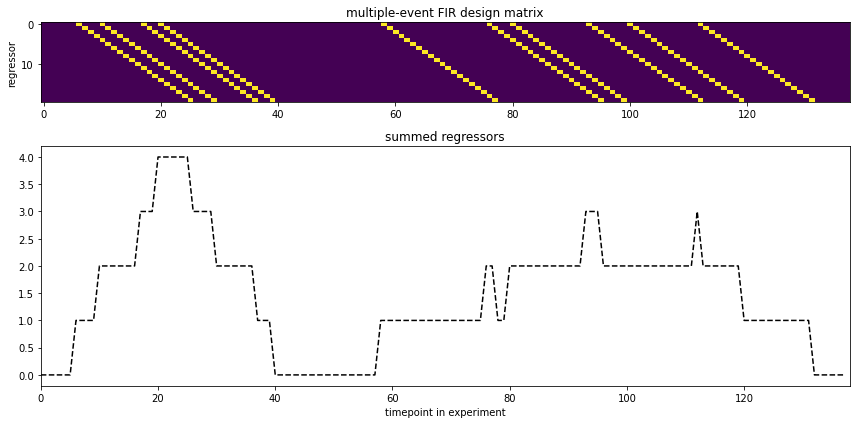

In [32]:
plot_dm(total_dm)

How does this design matrix allow us to capture stacked responses? Well, if BOLD responses are likely to be stacked together in the experiment - that is, due to events occurring close together, these regressors will all be trying to explain the same timepoints of data. This means that in the least-squares solution that the GLM obtains the signal variance will be distributed between the different regressors which stand for different post-event timepoints. If this still feels weird, please re-consult the explanation linked to above. 

For now, we'll continue with our actual signal time-courses and event times. 

We have two kinds of distractors - external and BOLD-related ones

In [33]:
!ls /content/data/hrf_mapper_59k/

# we'll load all the different event times we have, but will focus on the stimulus presentations for now.
blink_times = np.loadtxt(os.path.join('/content/data/hrf_mapper_59k/', 'sub-012_ses-2_task-hrfmapper_run-1_blink-times.tsv'), delimiter='\t')
sacc_times = np.loadtxt(os.path.join('/content/data/hrf_mapper_59k/', 'sub-012_ses-2_task-hrfmapper_run-1_sacc-times.tsv'), delimiter='\t')
stim_times = np.loadtxt(os.path.join('/content/data/hrf_mapper_59k/', 'sub-012_ses-2_task-hrfmapper_run-1_stim-times.tsv'), delimiter='\t')

sub-012_ses-2_task-hrfmapper_run-1_blink-times.tsv
sub-012_ses-2_task-hrfmapper_run-1_bold_confounds.tsv
sub-012_ses-2_task-hrfmapper_run-1_bold_space-T1w_preproc_59k.L.dtseries.gii
sub-012_ses-2_task-hrfmapper_run-1_bold_space-T1w_preproc_59k.R.dtseries.gii
sub-012_ses-2_task-hrfmapper_run-1_sacc-times.tsv
sub-012_ses-2_task-hrfmapper_run-1_stim-times.tsv


[ 19.843  25.508  34.967  38.742  43.468  49.136  58.593  63.318  71.819
  81.269  85.053  94.503 100.171 104.895 109.621 113.404 119.071 123.796
 133.247 137.03  140.805 145.531 150.256 162.541 167.273 171.048 176.724
 180.499 184.282 188.058 193.733 202.234 207.909 211.684 215.467 219.251
 223.026 231.535 236.26  240.985 245.71  249.486 257.996 270.278 281.62
 286.346 290.129 293.904 297.688 301.463 307.138 311.864 323.206 331.706
 337.381 343.048 347.773 351.558 356.282 364.783 376.125 379.908 388.409]


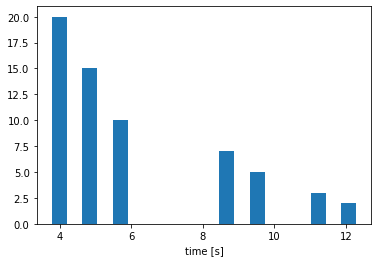

In [34]:
# when were these events?
print(stim_times)
plt.hist(np.diff(stim_times), bins=20);
plt.xlabel('time [s]');

In [35]:
# From the output above, you see that the events didn't occur at TR intervals. 
# we'll work with that in a bit. For now, we'll pretend that they did, and 
# round them off to the nearest TR (0.945s in this experiment)
tr = 0.945
stim_TRs_rounded = np.round(stim_times/tr).astype(int)
stim_TRs_rounded

array([ 21,  27,  37,  41,  46,  52,  62,  67,  76,  86,  90, 100, 106,
       111, 116, 120, 126, 131, 141, 145, 149, 154, 159, 172, 177, 181,
       187, 191, 195, 199, 205, 214, 220, 224, 228, 232, 236, 245, 250,
       255, 260, 264, 273, 286, 298, 303, 307, 311, 315, 319, 325, 330,
       342, 351, 357, 363, 368, 372, 377, 386, 398, 402, 411])

We see that the measurements are given in the TR indices, not time

In [36]:
# make sure no responses we try to fit run over the duration of our data
# this happens for the saccade times
stim_TRs_rounded = stim_TRs_rounded[stim_TRs_rounded < (tseries_raw.shape[1] - n_timepoints)]
stim_TRs_rounded

array([ 21,  27,  37,  41,  46,  52,  62,  67,  76,  86,  90, 100, 106,
       111, 116, 120, 126, 131, 141, 145, 149, 154, 159, 172, 177, 181,
       187, 191, 195, 199, 205, 214, 220, 224, 228, 232, 236, 245, 250,
       255, 260, 264, 273, 286, 298, 303, 307, 311, 315, 319, 325, 330,
       342, 351, 357, 363, 368, 372, 377, 386, 398, 402, 411])

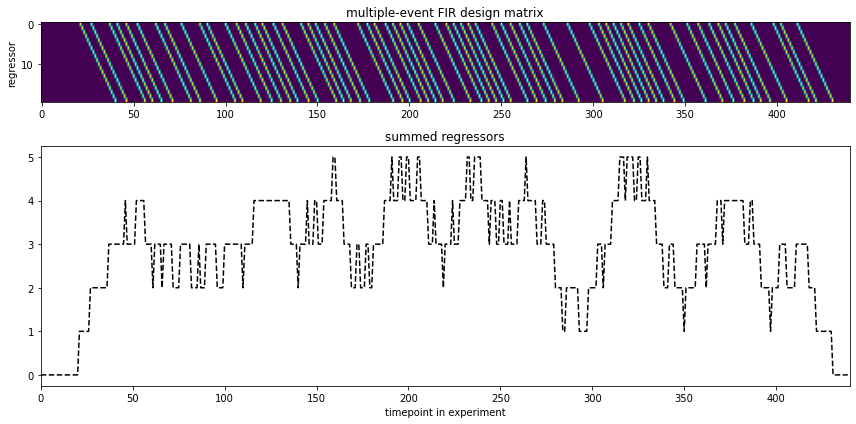

In [37]:
# But hey, now we're almost in the same place as with our simulated events! 
# This means we can create the design matrix immediately by code we already used!
total_dm = add_events_FIR(stim_TRs_rounded, 
                          data_duration=tseries_raw.shape[1], 
                          n_timepoints=20)

plot_dm(total_dm)

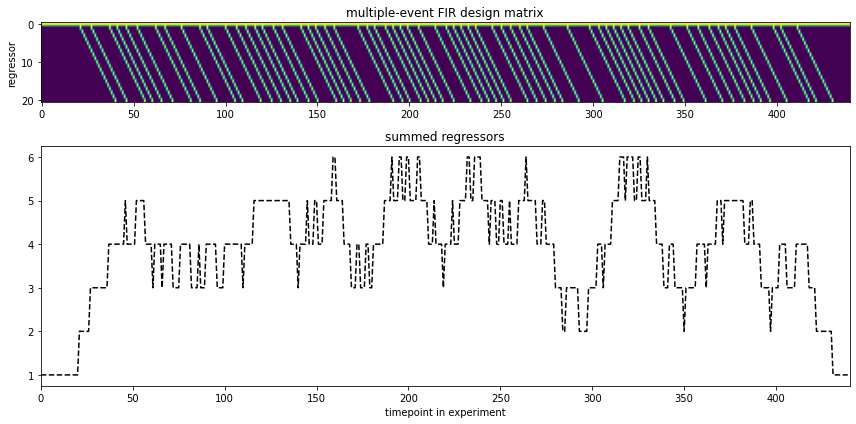

In [38]:
# Then, if we were to just add an intercept and disregard our preprocessing, we 
# could start performing the GLM!

glm_dm = np.hstack((np.ones((1,tseries_raw.shape[1])).T, total_dm))
plot_dm(glm_dm)

# Experiments

## Fitting the simple FIR model

Having built the design matrix, we can now perform a very simple GLM analysis, and we'll have our estimates of the BOLD response HRF shapes!

/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:212: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in true_divide
  """


Failed to get connection
** (inkscape:3210): CRITICAL **: 21:00:29.167: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3210): CRITICAL **: 21:00:29.168: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3210): CRITICAL **: 21:00:29.168: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


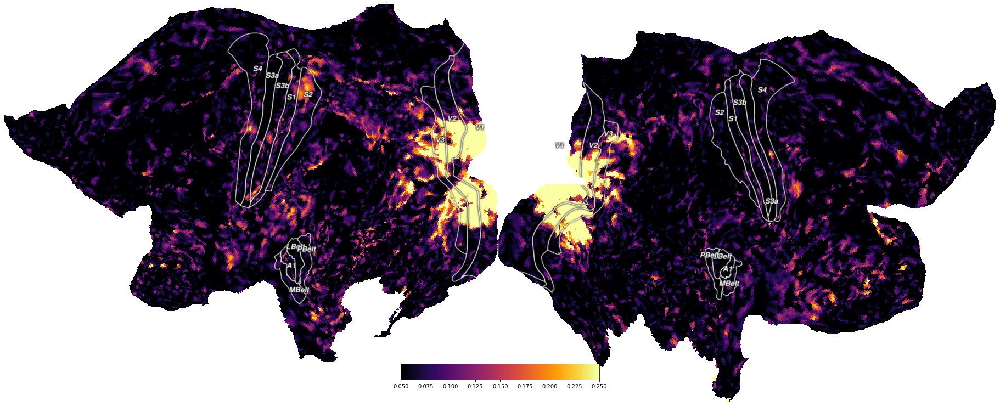

In [39]:
betas, rsq, y_hat, mse = fit_glm(X=glm_dm, y=tseries_psc)

# the rsq measure tells us where the voxels are whose signal is explained 
# using the FIR model. Not suprisingly, a simple visual stimulus causes
# BOLD responses mainly in low-level visual cortex.

cx.quickshow(cx.Vertex(rsq, subject='hcp_999999', cmap='inferno', vmin=0.05, vmax=0.25));
# cx.quickshow(cx.Vertex(rsq, subject='hcp_999999', cmap='inferno', vmin=0.05, vmax=0.45));

In [40]:
# we could use this cell to plot all time-points as flatmaps.
# This allows you to see the BOLD response unfold on the surface of the cortex
# Plotting this many flatmaps is going to take a while, so use with caution.

# f, sps = plt.subplots(n_timepoints, 1, figsize=(15,150))

# for i, beta in enumerate(betas[1:]): # intercept is not so interesting :)
#     cx.quickshow(cx.Vertex(beta*rsq, subject='hcp_999999', cmap='seismic', vmin=-3, vmax=3), fig=sps[i]);

2404 responsive voxels detected in the region


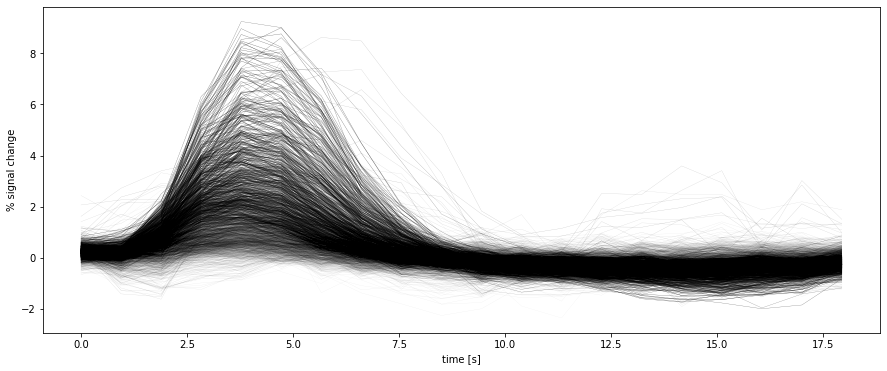

In [41]:
region_mask = atlas_data_both_hemis == 1
score_mask = rsq > 0.05
mask = region_mask&score_mask

plt.figure(figsize=(15, 6))
plot_responsive_vertex(rsq, betas, mask, betas_n=0, n_timepoints=20, c='k', lw=0.25)

## Task 1: Including Saccades and Blinks

In the first task, we also include the saccades and blinks as regressors, also using a FIR time course estimation for them.

In [42]:
# (1) Including the saccades
# round events off to the nearest TR (0.945s in this experiment)
sacc_TRs_rounded = np.round(sacc_times/tr).astype(int)
# make sure no responses we try to fit run over the duration of our data
# this happens for the saccade times
sacc_TRs_rounded = sacc_TRs_rounded[sacc_TRs_rounded < (tseries_raw.shape[1] - n_timepoints)]
sacc_TRs_rounded

array([  0,  34,  44,  44,  44,  58,  58,  58,  58,  59,  74, 104, 104,
       104, 119, 119, 122, 135, 137, 161, 176, 176, 183, 193, 206, 209,
       224, 258, 258, 270, 270, 270, 273, 273, 273, 279, 293, 305, 306,
       306, 306, 306, 318, 318, 318, 324, 324, 324, 324, 338, 347, 347,
       378, 390, 390, 400, 414, 416, 419])

In [43]:
# add to the already existing design matrix
sac_dm = add_events_FIR(stim_TRs_rounded, data_duration=tseries_raw.shape[1], n_timepoints=20)
sac_dm = add_events_FIR(sacc_TRs_rounded, dm=sac_dm, n_timepoints=20)
sac_dm = np.hstack((np.ones((tseries_raw.shape[1], 1)), sac_dm))

In [44]:
# (2) Include also the blinks
blink_TRs_rounded = np.round(blink_times/tr).astype(int)
blink_TRs_rounded = blink_TRs_rounded[blink_TRs_rounded < (tseries_raw.shape[1] - n_timepoints)]
blink_TRs_rounded

array([ 34, 104, 122, 176, 206, 258, 347, 400])

(440, 61)

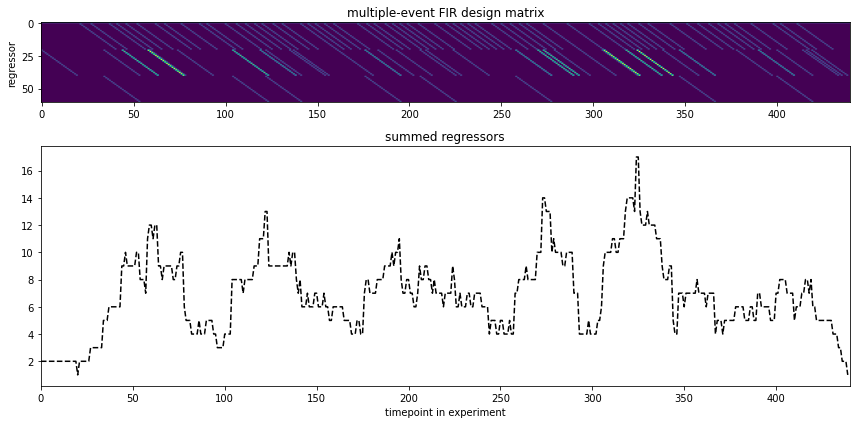

In [45]:
comb_dm = add_events_FIR(blink_TRs_rounded, dm=sac_dm, n_timepoints=20)
plot_dm(comb_dm)
comb_dm.shape #1 Intercept, 20 event, 20 saccades, 20 blink regressors = 61

/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:212: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in true_divide
  """


Failed to get connection
** (inkscape:3218): CRITICAL **: 21:00:47.771: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3218): CRITICAL **: 21:00:47.771: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3218): CRITICAL **: 21:00:47.771: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


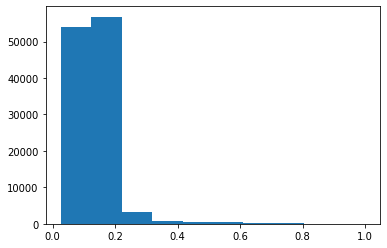

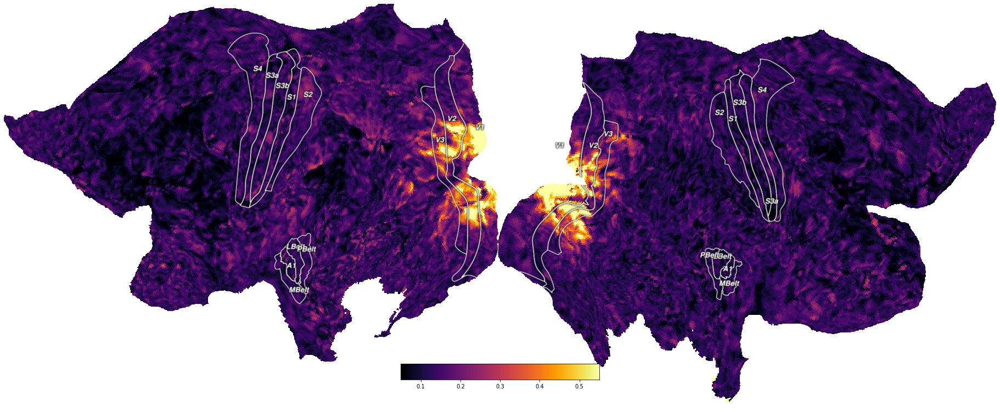

In [46]:
betas, rsq, y_hat, mse = fit_glm(X=comb_dm, y=tseries_psc)
plt.hist(rsq);

cx.quickshow(cx.Vertex(rsq, subject='hcp_999999', cmap='inferno', vmin=0.05, vmax=0.55));
# the rsq are already higher now

### HRF shape of the best fitting voxels in V1, V2, and V3

In [47]:
# V1
roi_boolean_mask_V1 = atlas_data_both_hemis == roi_index_dict.get("V1")
top_n = 1

best_rsq_mask_V1, best_rsq_idx_V1 = get_best_indices_mask(rsq, roi_boolean_mask_V1, top_n=top_n)
rsq[best_rsq_mask_V1]
# needed later on for comparison!

array([0.80877637])

In [48]:
# V2
roi_boolean_mask_V2 = atlas_data_both_hemis == roi_index_dict.get("V2")
best_rsq_mask_V2, best_rsq_idx_V2 = get_best_indices_mask(rsq, roi_boolean_mask_V2, 
                                                          top_n=top_n)
rsq[best_rsq_mask_V2]

array([0.76296492])

In [49]:
# V3
roi_boolean_mask_V3 = atlas_data_both_hemis == roi_index_dict.get("V3")

best_rsq_mask_V3, best_rsq_idx_V3 = get_best_indices_mask(rsq, roi_boolean_mask_V3, 
                                                          top_n=top_n)
rsq[best_rsq_mask_V3]

array([0.73965701])

In [50]:
best_rsq_mask_comb = np.logical_or(best_rsq_mask_V1, best_rsq_mask_V2)
best_rsq_mask_comb = np.logical_or(best_rsq_mask_comb, best_rsq_mask_V3)

1 responsive voxels detected in the region
1 responsive voxels detected in the region
1 responsive voxels detected in the region
1 responsive voxels detected in the region
1 responsive voxels detected in the region
1 responsive voxels detected in the region
1 responsive voxels detected in the region
1 responsive voxels detected in the region
1 responsive voxels detected in the region
3 responsive voxels detected in the region
3 responsive voxels detected in the region
3 responsive voxels detected in the region


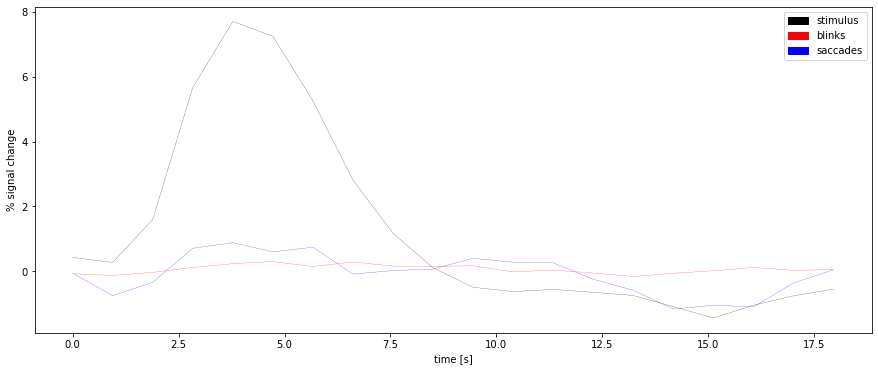

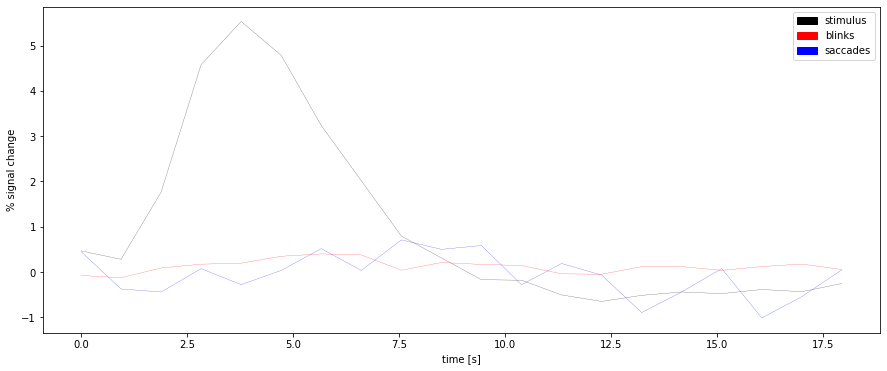

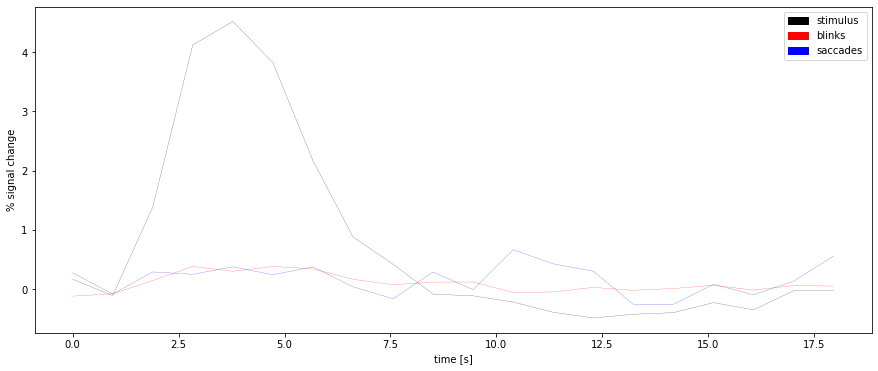

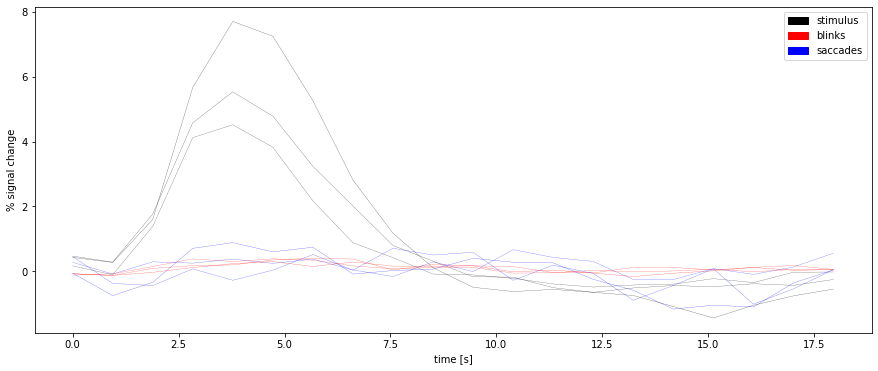

In [51]:
plt.figure(figsize=(15, 6))
# plot_responsive_vertex(rsq, betas, mask, betas_n=0, n_timepoints=20, c='k', lw=0.25)
plot_responsive_vertex_all(rsq, betas, mask=best_rsq_mask_V1)

plt.figure(figsize=(15, 6))
# plot_responsive_vertex(rsq, betas, mask, betas_n=0, n_timepoints=20, c='k', lw=0.25)
plot_responsive_vertex_all(rsq, 
                           betas=betas, 
                           mask=best_rsq_mask_V2)

plt.figure(figsize=(15, 6))
# plot_responsive_vertex(rsq, betas, mask, betas_n=0, n_timepoints=20, c='k', lw=0.25)
plot_responsive_vertex_all(rsq, 
                           betas=betas, 
                           mask=best_rsq_mask_V3)

plt.figure(figsize=(15, 6))
# plot_responsive_vertex(rsq, betas, mask, betas_n=0, n_timepoints=20, c='k', lw=0.25)
plot_responsive_vertex_all(rsq, 
                           betas=betas, 
                           mask=best_rsq_mask_comb)

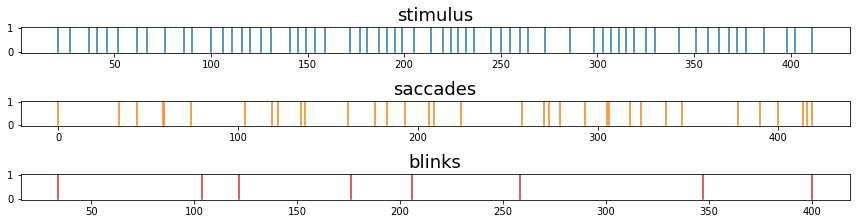

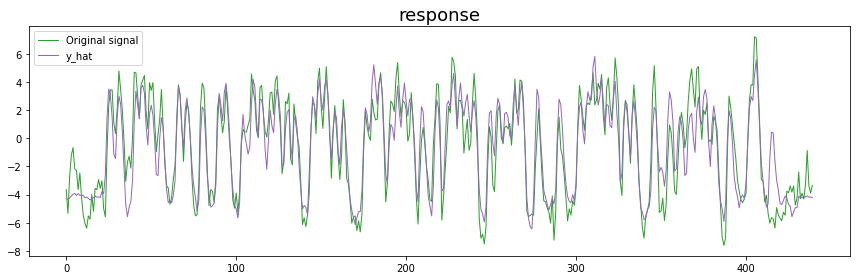

In [52]:
plot_time_course({"Original signal": tseries_psc[best_rsq_idx_V1[0]], 
                  "y_hat": y_hat[best_rsq_idx_V1[0]]}, 
                 {'stimulus': stim_TRs_rounded,
                  'saccades': sacc_TRs_rounded,
                  'blinks': blink_TRs_rounded})

### Average response time course in V1, V2, and V3 + 95% confidence interval


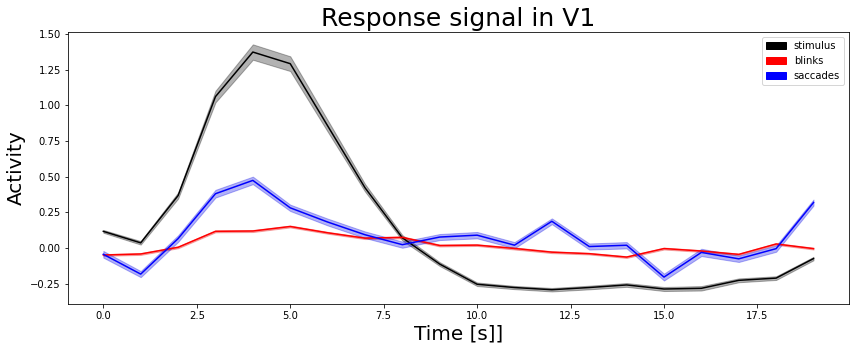

In [53]:

plt.figure(figsize=(14, 5))
plot_responsive_vertex_time_course_all(betas, roi_boolean_mask_V1,
                                       n_timepoints=20, percentile=0.975)
plt.xlabel("Time [s]]", fontsize=20)
plt.ylabel("Activity", fontsize=20)
plt.title("Response signal in V1", fontsize=25);

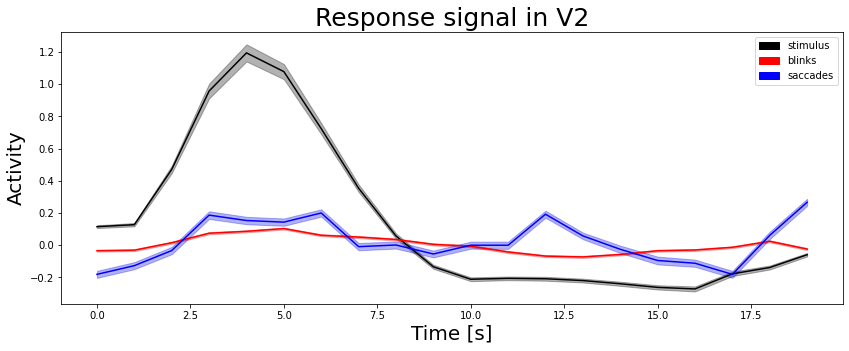

In [54]:
plt.figure(figsize=(14, 5))
plot_responsive_vertex_time_course_all(betas, roi_boolean_mask_V2,
                                       n_timepoints=20, percentile=0.975)
plt.xlabel("Time [s]", fontsize=20)
plt.ylabel("Activity", fontsize=20)
plt.title("Response signal in V2", fontsize=25);

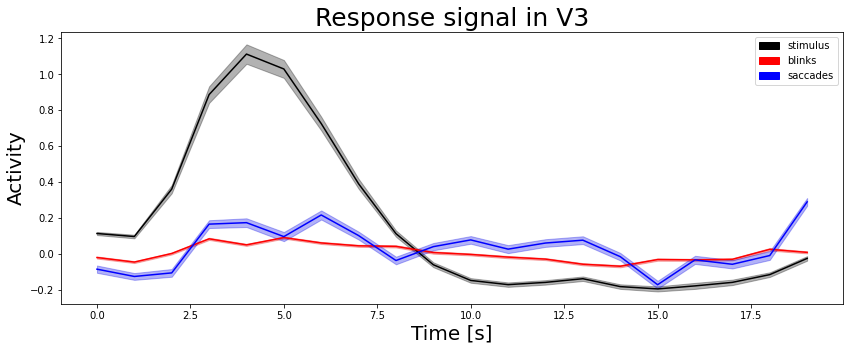

In [55]:
plt.figure(figsize=(14, 5))
plot_responsive_vertex_time_course_all(betas, roi_boolean_mask_V3,
                                       n_timepoints=20, percentile=0.975)
plt.xlabel("Time [s]", fontsize=20)
plt.ylabel("Activity", fontsize=20)
plt.title("Response signal in V3", fontsize=25);

## Task 2: Including also slow drift and nuisance regressors

Is the shape of the HRF changing when including all the different slow drift and nuisance regressors?

In [56]:
# and, for convenience, we'll also read in the confounds for later use here. 
# for example, the bold_confounds dataframe contains slow drift regressors...
# these are called CosineXXX.
import pandas as pd
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
bold_confounds = pd.read_csv(os.path.join('/content/data/hrf_mapper_59k/', 
                                          'sub-012_ses-2_task-hrfmapper_run-1_bold_confounds.tsv'), 
                             delimiter='\t')

In [57]:
# need aCompCor, tCompCor, Cosine, FD/dvars
# columns 3 - 24
nuisance_df = bold_confounds.iloc[:, 3:24]
print(nuisance_df.shape)
nuisance_df.head(2)

(440, 21)


,stdDVARS,non-stdDVARS,vx-wisestdDVARS,FramewiseDisplacement,tCompCor00,tCompCor01,tCompCor02,tCompCor03,tCompCor04,tCompCor05,aCompCor00,aCompCor01,aCompCor02,aCompCor03,aCompCor04,aCompCor05,Cosine00,Cosine01,Cosine02,Cosine03,Cosine04
0,NaN,NaN,NaN,NaN,-0.046458,-0.035533,0.058893,-0.019503,0.017771,-0.067070,-0.027876,0.035215,-0.056263,0.023107,-0.071911,0.025904,0.067420,0.067418,0.067416,0.067413,0.067409
1,1.158334,44.830067,0.975279,0.063663,-0.065542,0.011252,0.086448,0.004999,-0.081686,0.001727,0.057522,0.049051,-0.074671,-0.029025,-0.021253,0.040975,0.067416,0.067405,0.067385,0.067358,0.067323


In [58]:
nuisance_df.isna().sum()

stdDVARS                 1
non-stdDVARS             1
vx-wisestdDVARS          1
FramewiseDisplacement    1
tCompCor00               0
tCompCor01               0
tCompCor02               0
tCompCor03               0
tCompCor04               0
tCompCor05               0
aCompCor00               0
aCompCor01               0
aCompCor02               0
aCompCor03               0
aCompCor04               0
aCompCor05               0
Cosine00                 0
Cosine01                 0
Cosine02                 0
Cosine03                 0
Cosine04                 0
dtype: int64

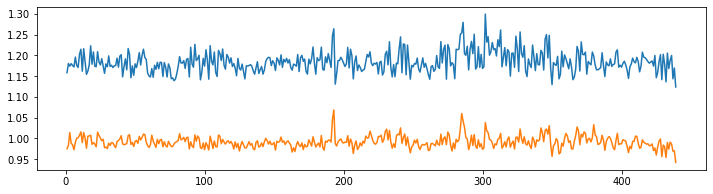

In [59]:
plt.figure(figsize=(12, 3))
plt.plot(nuisance_df['stdDVARS']);
plt.plot(nuisance_df['vx-wisestdDVARS']);

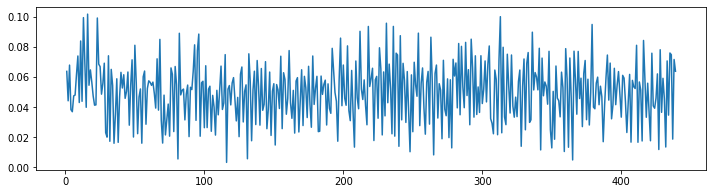

In [60]:
plt.figure(figsize=(12, 3))
plt.plot(nuisance_df['FramewiseDisplacement']);

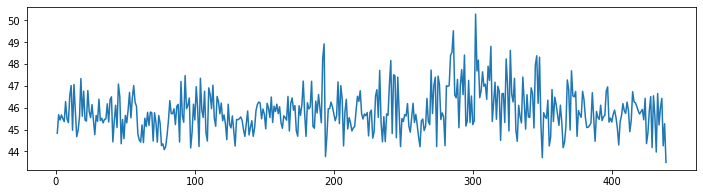

In [61]:
plt.figure(figsize=(12, 3))
plt.plot(nuisance_df['non-stdDVARS']);

We see that the signals containing nans have only one missing value, and this value is at the very beginning of the fluctuating signal. In order not to leak a lot we will replace these nans with the closest available values (instead of making them zero or using the average).

In [62]:
nuisance_df.fillna(method='bfill', inplace=True)

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:5182: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  downcast=downcast,


In [63]:
# next step: add them to the design matrix:
comb_nuisance_dm = np.hstack((comb_dm, nuisance_df))
comb_nuisance_dm.shape # 61 from before + 21 nuisance regressors = 82

(440, 82)

/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:212: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in true_divide
  """


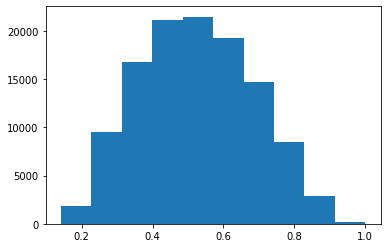

In [64]:
## then fit the model again:
# y should not be filtered, as slow drift regressors are added here?
betas_task2, rsq_task2, y_hat_task2, mse_task2 = fit_glm(comb_nuisance_dm, tseries_psc)
plt.hist(rsq_task2);

Failed to get connection
** (inkscape:3226): CRITICAL **: 21:01:05.194: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3226): CRITICAL **: 21:01:05.194: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3226): CRITICAL **: 21:01:05.194: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


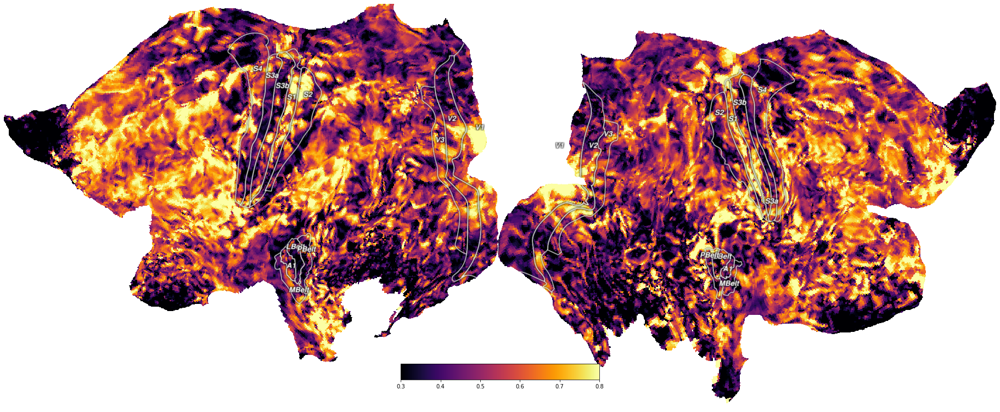

In [65]:
cx.quickshow(cx.Vertex(rsq_task2, subject='hcp_999999', cmap='inferno', vmin=0.3, vmax=0.8));
# the rsq are are higher now, but rather unspecific in all regions than in only in the visual cortex

### Re-plot of the HRF shape of the best fitting voxels in V1, V2, and V3

1 responsive voxels detected in the region
1 responsive voxels detected in the region
1 responsive voxels detected in the region
1 responsive voxels detected in the region
1 responsive voxels detected in the region
1 responsive voxels detected in the region
1 responsive voxels detected in the region
1 responsive voxels detected in the region
1 responsive voxels detected in the region
3 responsive voxels detected in the region
3 responsive voxels detected in the region
3 responsive voxels detected in the region


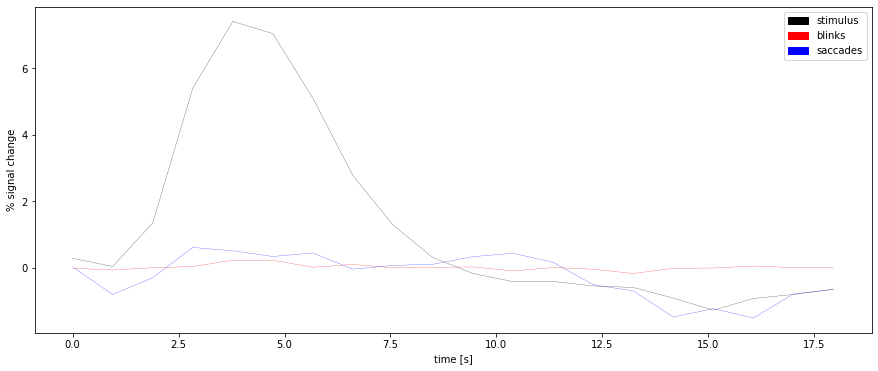

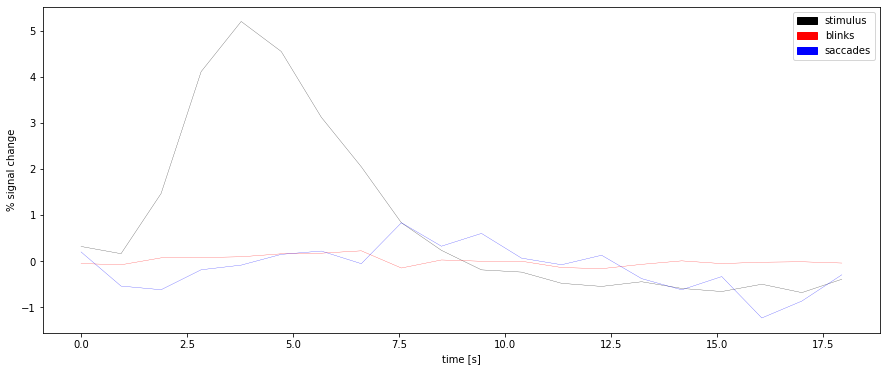

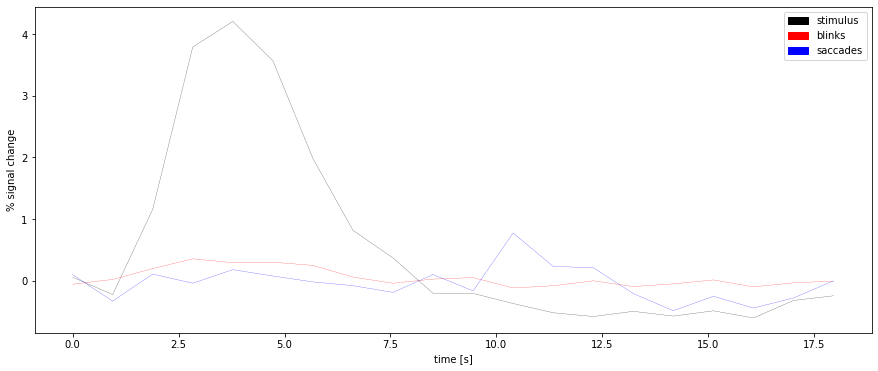

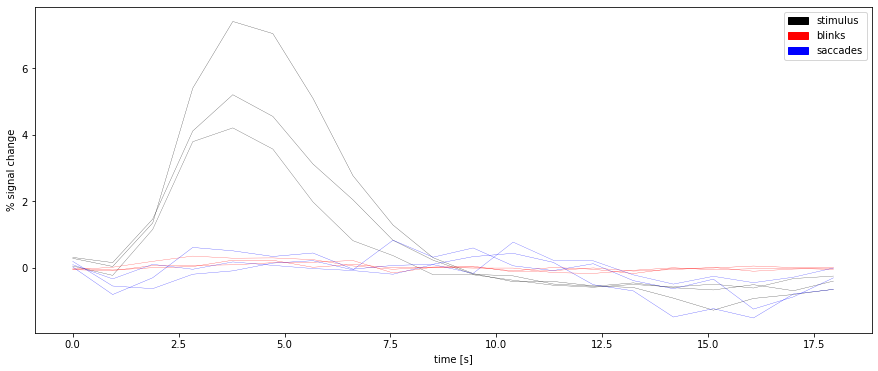

In [66]:
plt.figure(figsize=(15, 6))
plot_responsive_vertex_all(rsq_task2, betas_task2, mask=best_rsq_mask_V1)

plt.figure(figsize=(15, 6))
plot_responsive_vertex_all(rsq_task2, 
                           betas=betas_task2, 
                           mask=best_rsq_mask_V2)

plt.figure(figsize=(15, 6))
plot_responsive_vertex_all(rsq_task2, 
                           betas=betas_task2, 
                           mask=best_rsq_mask_V3)

plt.figure(figsize=(15, 6))
plot_responsive_vertex_all(rsq_task2, 
                           betas=betas_task2, 
                           mask=best_rsq_mask_comb)

The shapes appear to be very similar as in the analysis without all the nuisance regressors.

### Re-plot of average response time course in V1, V2, and V3 + 95% confidence interval



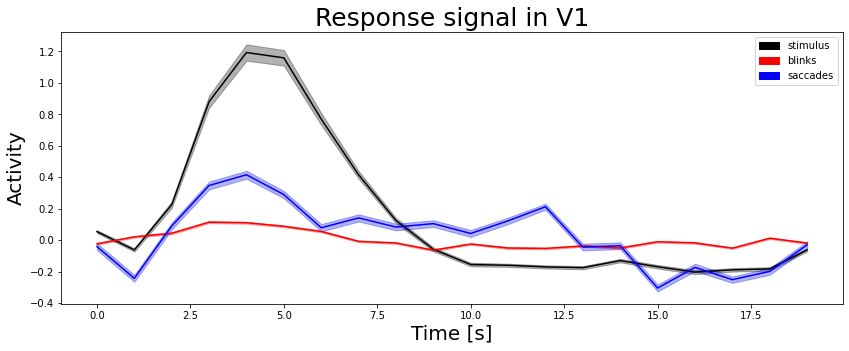

In [67]:
plt.figure(figsize=(14, 5))
plot_responsive_vertex_time_course_all(betas_task2, roi_boolean_mask_V1,
                                       n_timepoints=20, percentile=0.975)
plt.xlabel("Time [s]", fontsize=20)
plt.ylabel("Activity", fontsize=20)
plt.title("Response signal in V1", fontsize=25);

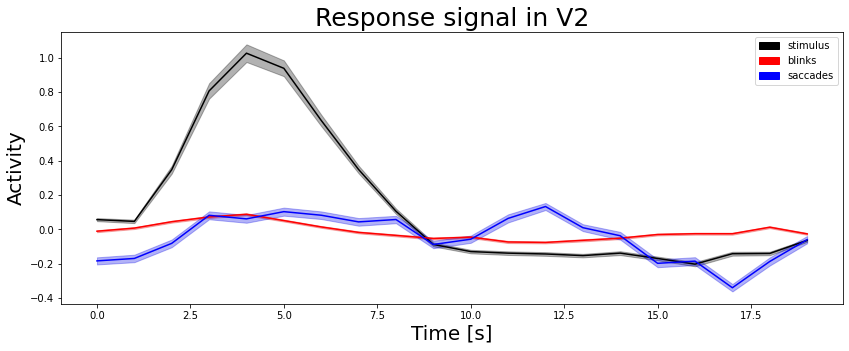

In [68]:
plt.figure(figsize=(14, 5))
plot_responsive_vertex_time_course_all(betas_task2, roi_boolean_mask_V2,
                                       n_timepoints=20, percentile=0.975)
plt.xlabel("Time [s]", fontsize=20)
plt.ylabel("Activity", fontsize=20)
plt.title("Response signal in V2", fontsize=25);

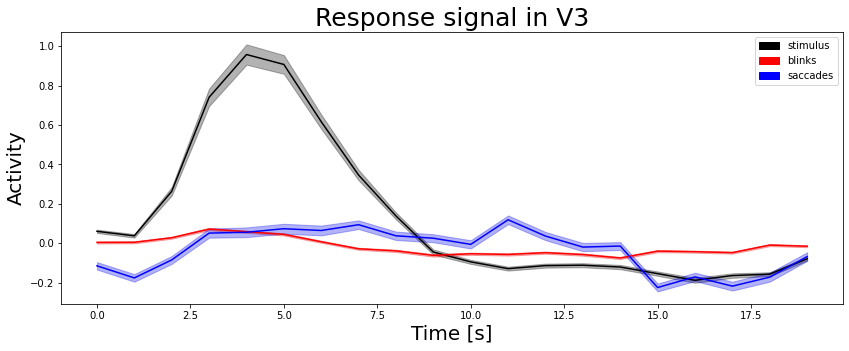

In [69]:
plt.figure(figsize=(14, 5))
plot_responsive_vertex_time_course_all(betas_task2, roi_boolean_mask_V3,
                                       n_timepoints=20, percentile=0.975)
plt.xlabel("Time [s]", fontsize=20)
plt.ylabel("Activity", fontsize=20)
plt.title("Response signal in V3", fontsize=25);

###  T-statistic for each of the aCompCorr regressors onto flatmaps

In [70]:
# (1) need all t-statistics 

# design variance only for single column or contrast, so going for a foor loop
# for all a CompCorr (columns 70:75 in the design_matrix)

# empty array for t-vals
t_vals = np.zeros(shape = (tseries_raw.shape[0], 6))

cols = np.arange(70, 76)

N = tseries_raw.shape[1] #440
P = comb_nuisance_dm.shape[1] #82
df = (N - P)
df

358

In [71]:
from tqdm.notebook import tqdm 

dv_list = [design_variance(comb_nuisance_dm, which_predictor=col) for col in cols]

## sigma_hat same for all 5 regressors, thus outer loop every vertex
for i in tqdm(range(t_vals.shape[0])):
  sigma_hat = np.sum((tseries_psc[i] - y_hat_task2[i]) ** 2) / df
    
  ## inner loop for all 6 aCompCorr regressors
  for idx, zipped in enumerate(zip(cols, dv_list)):
      col, design_variance_beta = zipped
      t_vals[i][idx] = betas_task2[col][i] / np.sqrt(sigma_hat * design_variance_beta)

  0%|          | 0/118584 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in double_scalars
  if sys.path[0] == '':


In [72]:
pd.DataFrame(t_vals).describe()

,0,1,2,3,4,5
count,116348.000000,116348.000000,116348.000000,116348.000000,116348.000000,116348.000000
mean,-0.001943,0.000873,0.000200,0.002061,-0.000559,-0.000248
std,0.002055,0.002480,0.006090,0.005171,0.004235,0.002254
min,-0.017837,-0.013204,-0.024559,-0.019856,-0.021411,-0.013433
25%,-0.003211,-0.000662,-0.003869,-0.000766,-0.003339,-0.001748
50%,-0.001957,0.000874,0.000186,0.001846,-0.000500,-0.000233
75%,-0.000678,0.002430,0.004301,0.004885,0.002310,0.001264
max,0.017802,0.014978,0.025934,0.031741,0.021003,0.011000


Failed to get connection
** (inkscape:3233): CRITICAL **: 21:01:15.959: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3233): CRITICAL **: 21:01:15.959: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3233): CRITICAL **: 21:01:15.959: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed
Failed to get connection
** (inkscape:3236): CRITICAL **: 21:01:17.296: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3236): CRITICAL **: 21:01:17.296: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3236): CRITICAL **: 21:01:17.296: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed
Failed to get connection
** (inkscape:3239): CRITICAL **: 21:01:18.612: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3239): CRITICAL **: 21:01:18.612: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3239)

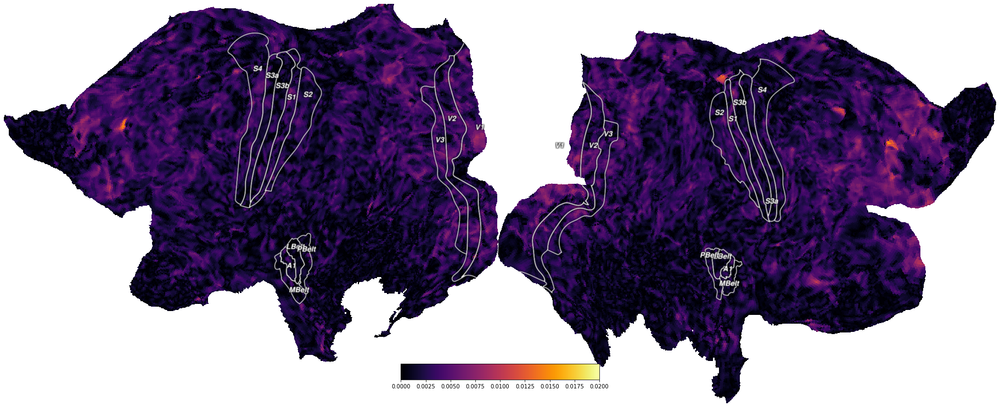

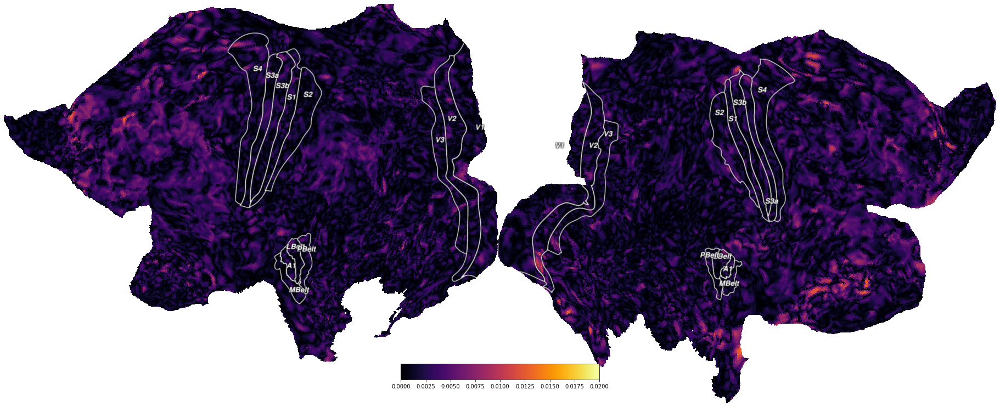

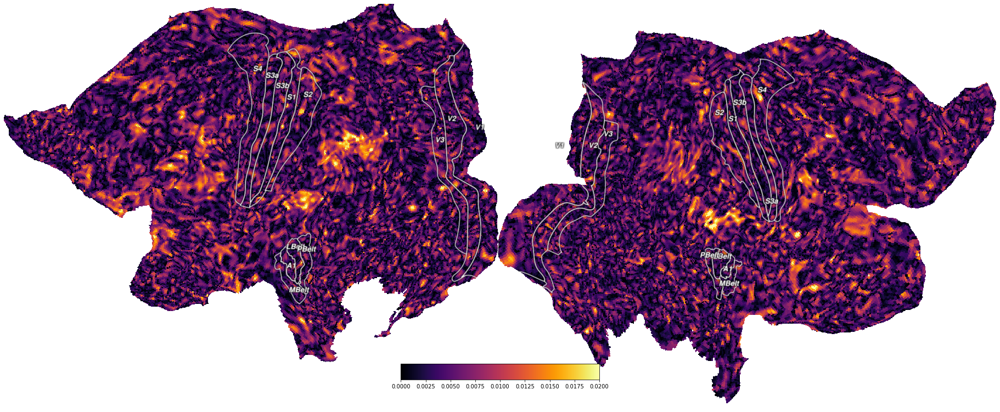

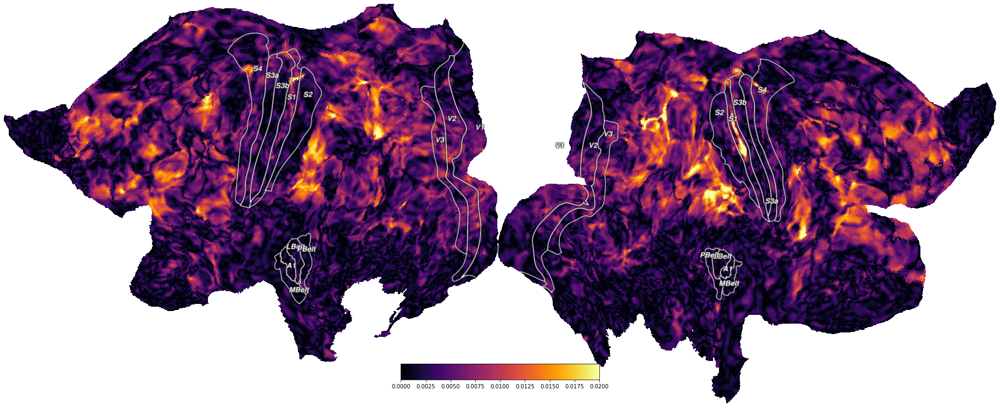

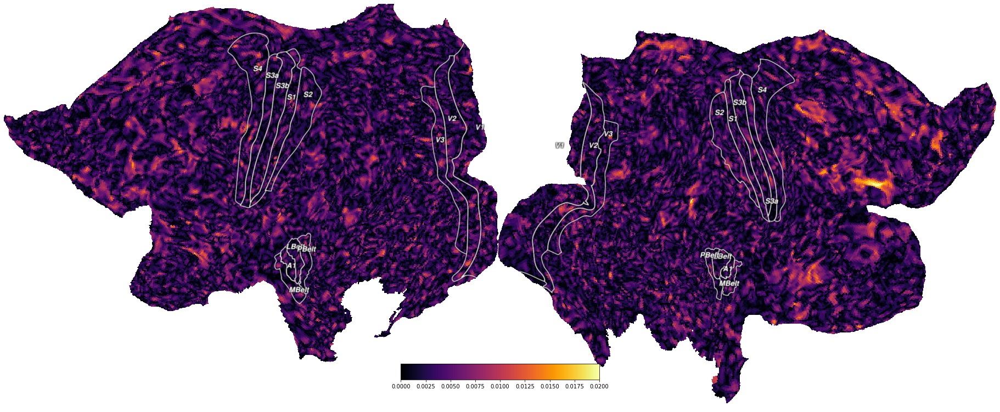

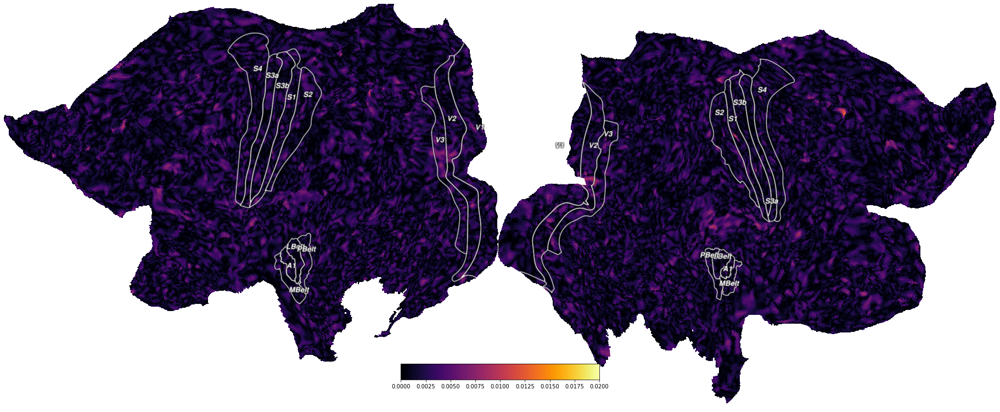

In [73]:
for i in range(t_vals.shape[1]):
  cx.quickshow(cx.Vertex(abs(t_vals[:, i]), subject='hcp_999999', cmap='inferno', vmin=0, vmax=0.02));
# use abs of t vals, direction is not important

They seem to be unspecific regarding the visual cortex, but there are some overlaps to the rsq of the model that includes all the nuisance regressors. 

## Task3: redo task2 with harmonica-data###

 

In [74]:
n_harmonics = 3

In [75]:
# making 3fold harmonica of functional data (ON FILTERED_PSC) (axis =1) 
print(tseries_psc.shape)
tseries_harm = np.repeat(tseries_psc, n_harmonics, axis = 1)
print(tseries_harm.shape)
#so 3 times more data points for same overall recording time

(118584, 440)
(118584, 1320)


In [76]:
# so new TR
TR_task3 = TR/n_harmonics
TR_task3

0.315

In [77]:
# nuisance_df has the needed confounds, processed for NA
print(nuisance_df.shape) #need to change it as now we have 3xtimepoints
nuisance_df.head()

(440, 21)


,stdDVARS,non-stdDVARS,vx-wisestdDVARS,FramewiseDisplacement,tCompCor00,tCompCor01,tCompCor02,tCompCor03,tCompCor04,tCompCor05,aCompCor00,aCompCor01,aCompCor02,aCompCor03,aCompCor04,aCompCor05,Cosine00,Cosine01,Cosine02,Cosine03,Cosine04
0,1.158334,44.830067,0.975279,0.063663,-0.046458,-0.035533,0.058893,-0.019503,0.017771,-0.067070,-0.027876,0.035215,-0.056263,0.023107,-0.071911,0.025904,0.067420,0.067418,0.067416,0.067413,0.067409
1,1.158334,44.830067,0.975279,0.063663,-0.065542,0.011252,0.086448,0.004999,-0.081686,0.001727,0.057522,0.049051,-0.074671,-0.029025,-0.021253,0.040975,0.067416,0.067405,0.067385,0.067358,0.067323
2,1.180326,45.681202,0.983536,0.044131,-0.007144,0.062104,0.074606,0.078992,0.034796,0.009839,0.075742,-0.019994,-0.040933,-0.061956,0.029557,-0.001230,0.067409,0.067377,0.067323,0.067248,0.067152
3,1.174073,45.439209,1.014269,0.067836,0.046916,0.044904,0.010084,0.027403,0.035415,-0.080289,-0.002530,-0.059261,0.031888,-0.036995,0.062988,-0.010618,0.067399,0.067336,0.067231,0.067083,0.066894
4,1.180041,45.670193,0.988277,0.038272,0.067986,-0.009028,-0.054827,-0.027295,-0.086624,-0.045312,-0.045762,-0.044147,0.058836,-0.001248,-0.038988,0.013206,0.067385,0.067281,0.067107,0.066864,0.066552


In [78]:
#handling nusiance df for new 
#nuisance_df.iloc[:,1]#checking before
nuisance_df_harm = np.repeat([nuisance_df], n_harmonics, axis = 1) #repeating column values 3 times
nuisance_df_harm = np.squeeze(nuisance_df_harm, axis =0) #squeezing out extra axis
nuisance_df_harm.shape #it matches tseries_harm shape!

(1320, 21)

In [79]:
# next step: we need to rebuild dm for 60 timepoints
# so starting from scratch:
n_timepoints_task3 = n_timepoints * n_harmonics #x more datapoints
n_timepoints_task3

60

(1320, 181)


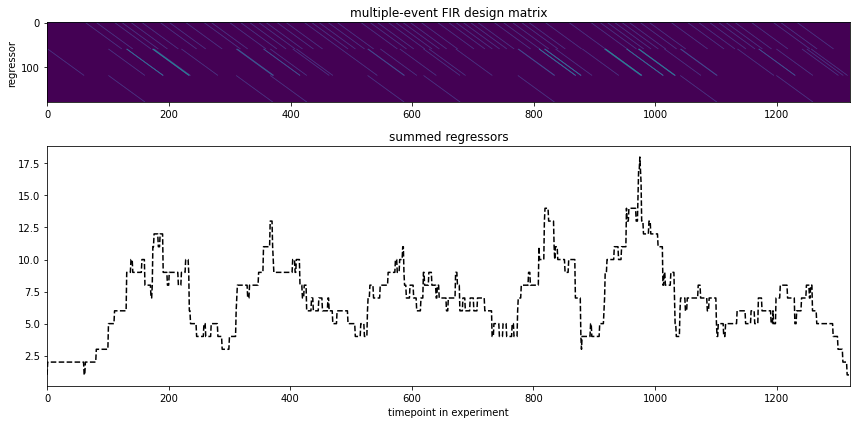

In [80]:
# rounding again to closest TR (newTR in task3!)
sacc_TRs_rounded_task3 = np.round(sacc_times/TR_task3).astype(int)
stim_TRs_rounded_task3 = np.round(stim_times/TR_task3).astype(int)
blink_TRs_rounded_task3 = np.round(blink_times/TR_task3).astype(int)

# and again making sure no responses we try to fit run over the duration of our data
sacc_TRs_rounded_task3 = sacc_TRs_rounded_task3[sacc_TRs_rounded_task3 < (tseries_harm.shape[1] - n_timepoints_task3)]
stim_TRs_rounded_task3 = stim_TRs_rounded_task3[stim_TRs_rounded_task3 < (tseries_harm.shape[1] - n_timepoints_task3)]
blink_TRs_rounded_task3 = blink_TRs_rounded_task3[blink_TRs_rounded_task3 < (tseries_harm.shape[1] - n_timepoints_task3)]

# making DM
task3_dm = add_events_FIR(stim_TRs_rounded_task3, data_duration = tseries_harm.shape[1], n_timepoints=n_timepoints_task3)
task3_dm = add_events_FIR(sacc_TRs_rounded_task3, dm = task3_dm, n_timepoints = n_timepoints_task3)
task3_dm = add_events_FIR(blink_TRs_rounded_task3, dm = task3_dm, n_timepoints = n_timepoints_task3)
task3_dm = np.hstack((np.ones((tseries_harm.shape[1], 1)), task3_dm))
print(task3_dm.shape)

plot_dm(task3_dm) #1320 timepoints(rows), 3x60cols(3events) +1(intercept); looks the same with other x axis

In [81]:
# Finally add confounds to the design matrix:
comb_dm_task3 = np.hstack((task3_dm, nuisance_df_harm))
comb_dm_task3.shape

(1320, 202)

/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:212: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in true_divide
  """


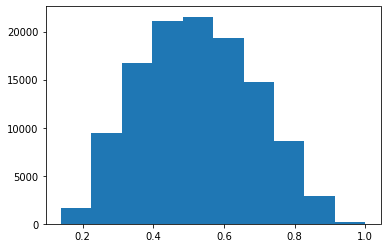

In [82]:
## then fit the model again:
# y should not be filtered, as the slow drift regressors are added
betas_task3, rsq_task3, y_hat_task3, mse_task3 = fit_glm(comb_dm_task3, tseries_harm)
plt.hist(rsq_task3); 


### Re-plot of the HRF shape of the best fitting voxels in V1, V2, and V3

In [83]:
#checking values from task1
print(sorted(rsq_task2[best_rsq_mask_V1]))
print(sorted(rsq_task3[best_rsq_mask_V1]))
print(sorted(rsq_task2[best_rsq_mask_V2]))
print(sorted(rsq_task3[best_rsq_mask_V2]))
print(sorted(rsq_task2[best_rsq_mask_V3]))
print(sorted(rsq_task3[best_rsq_mask_V3]))
# -> only a little bit better with the higher temporal resolution

[0.9008467027628999]
[0.9024094258871396]
[0.8735708436472804]
[0.8739904853980935]
[0.8308463719168337]
[0.8330141327403409]


1 responsive voxels detected in the region
1 responsive voxels detected in the region
1 responsive voxels detected in the region
1 responsive voxels detected in the region
1 responsive voxels detected in the region
1 responsive voxels detected in the region
1 responsive voxels detected in the region
1 responsive voxels detected in the region
1 responsive voxels detected in the region
3 responsive voxels detected in the region
3 responsive voxels detected in the region
3 responsive voxels detected in the region


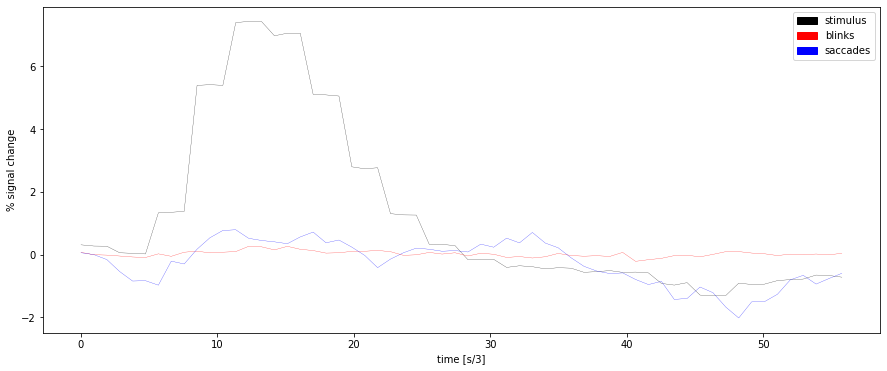

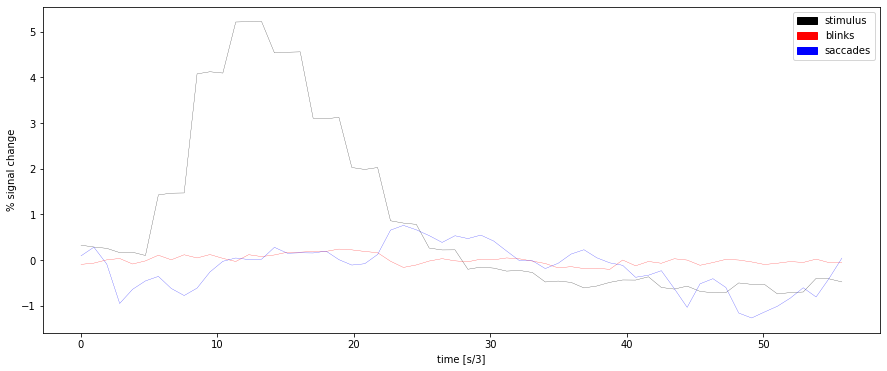

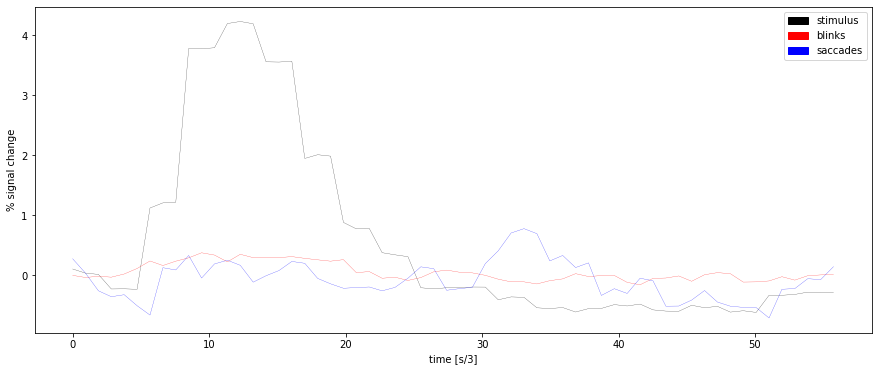

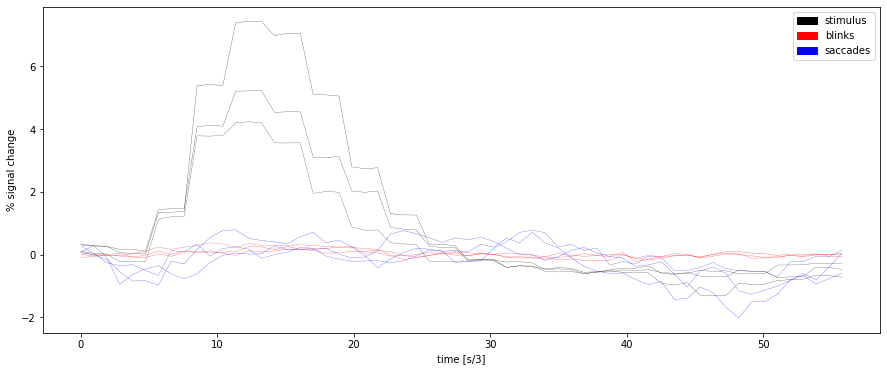

In [84]:
plt.figure(figsize=(15, 6))
plot_responsive_vertex_all(rsq_task3, betas_task3, mask=best_rsq_mask_V1, n_timepoints=60, xlabel = "time [s/3]")

plt.figure(figsize=(15, 6))
plot_responsive_vertex_all(rsq_task3, 
                           betas=betas_task3, 
                           mask=best_rsq_mask_V2, n_timepoints=60, xlabel = "time [s/3]")

plt.figure(figsize=(15, 6))
plot_responsive_vertex_all(rsq_task3, 
                           betas=betas_task3, 
                           mask=best_rsq_mask_V3, n_timepoints=60, xlabel = "time [s/3]")

plt.figure(figsize=(15, 6))
plot_responsive_vertex_all(rsq_task3, 
                           betas=betas_task3, 
                           mask=best_rsq_mask_comb, n_timepoints=60, xlabel = "time [s/3]")

### Re-plot of average response time course in V1, V2, and V3 + 95% confidence interval


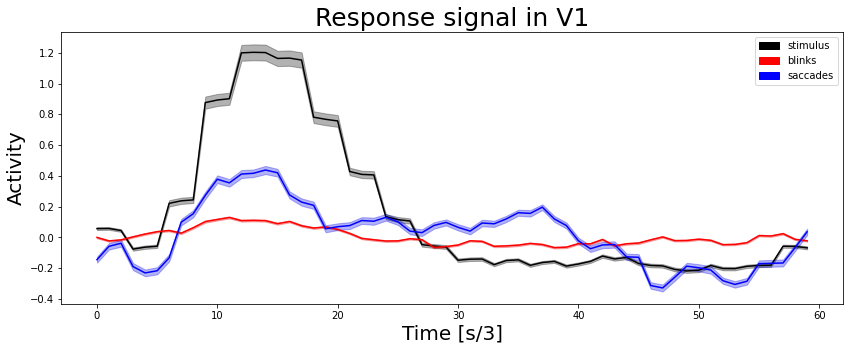

In [85]:
plt.figure(figsize=(14, 5))
plot_responsive_vertex_time_course_all(betas_task3, roi_boolean_mask_V1,
                                       n_timepoints=60, percentile=0.975)
plt.xlabel("Time [s/3]", fontsize=20)
plt.ylabel("Activity", fontsize=20)
plt.title("Response signal in V1", fontsize=25);

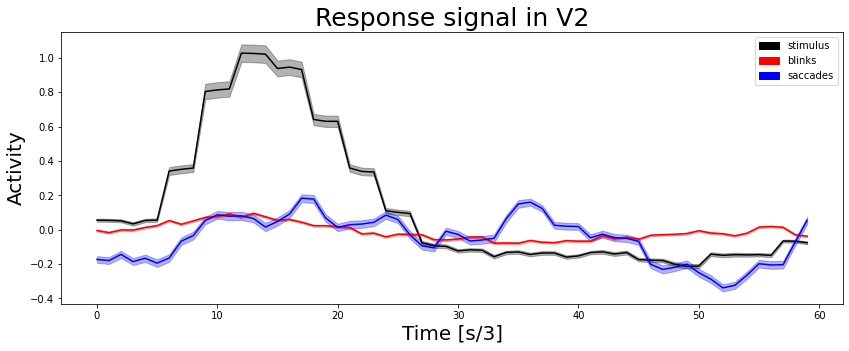

In [86]:
plt.figure(figsize=(14, 5))
plot_responsive_vertex_time_course_all(betas_task3, roi_boolean_mask_V2,
                                       n_timepoints=60, percentile=0.975)
plt.xlabel("Time [s/3]", fontsize=20)
plt.ylabel("Activity", fontsize=20)
plt.title("Response signal in V2", fontsize=25);

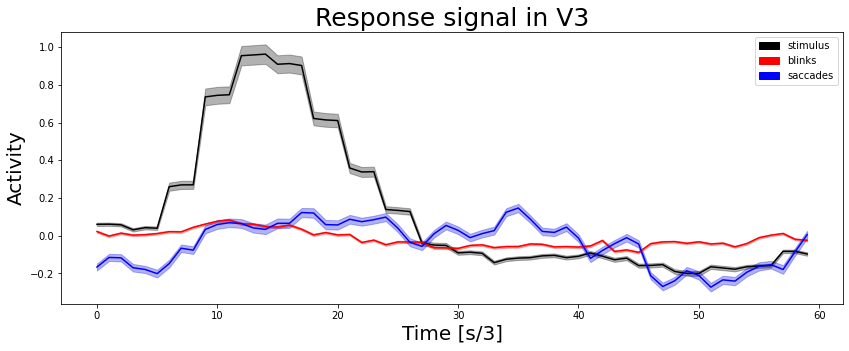

In [87]:
plt.figure(figsize=(14, 5))
plot_responsive_vertex_time_course_all(betas_task3, roi_boolean_mask_V3,
                                       n_timepoints=60, percentile=0.975)
plt.xlabel("Time [s/3]", fontsize=20)
plt.ylabel("Activity", fontsize=20)
plt.title("Response signal in V3", fontsize=25);

## Task 4: Comparison to temporal basis set

In [88]:
def plot_time_course_task4(response_ts_dict, events_dict, title):
    from itertools import cycle
    cycol = cycle(['tab:blue', 'tab:orange', 'tab:red', 'tab:green', 'tab:purple'])
    plt.xlabel('time [s]')
    plt.ylabel('% signal change');
    for response_ts in response_ts_dict.values():
        col = "black"
        plt.plot(response_ts, lw=0.5, c=col)
    plt.title(title, fontsize=18)

def plot_responsive_vertex_all_task4(rsq, betas, mask, n_timepoints=20, title = ""):
    plot_responsive_vertex(rsq, betas, mask, betas_n=0, n_timepoints=n_timepoints, c='black', lw=0.5)
    plt.title(title, fontsize=18)

def single_gamma(x, lag=6, b=0.9, scale=True):
    b = b 
    a = lag 
    d = a * b
    hrf = (x/d)**a * np.exp(-(x-d)/b)
    
    if scale:
        hrf = (1 - hrf.min()) * (hrf - hrf.min()) / (hrf.max() - hrf.min()) + hrf.min()

    return hrf

def ReturnConvolvedBasisPred(eventArray):
  sg_hrf = single_gamma(np.arange(0, 50))
  sg_hrf_temp = np.diff(sg_hrf)
  sg_hrf_disp = np.diff(sg_hrf_temp)

  # Differentiation trims of one value, so we need to add that back
  sg_hrf_temp = np.append(sg_hrf_temp, 0)
  sg_hrf_disp = np.append(sg_hrf_disp, [0, 0])

  pred_hrf = np.convolve(sg_hrf, eventArray.squeeze()) # Convolving
  pred_hrf = pred_hrf[:eventArray.size] # Trimming
  pred_hrf = pred_hrf[:, np.newaxis] # Adding axis for later stacking in design matrix

  pred_time = np.convolve(sg_hrf_temp, eventArray.squeeze()) # Convolving
  pred_time = pred_time[:eventArray.size] # Trimming
  pred_time = pred_time[:, np.newaxis] # Adding axis for later stacking in design matrix

  pred_dispersion = np.convolve(sg_hrf_disp, eventArray.squeeze()) # Convolving
  pred_dispersion = pred_dispersion[:eventArray.size] # Trimming
  pred_dispersion = pred_dispersion[:, np.newaxis] # Adding axis for later stacking in design matrix
  return pred_hrf, pred_time, pred_dispersion


In [89]:

# Here we build the new predictors for the design matrix

stimulus_pred = np.zeros((tseries_raw[1].size, 1))
stimulus_pred[stim_TRs_rounded.astype(int)] = 1
stimulus_pred = stimulus_pred.squeeze()

sacc_pred = np.zeros((tseries_raw[1].size, 1))
sacc_pred[sacc_TRs_rounded.astype(int)] = 1
sacc_pred = sacc_pred.squeeze()

blink_pred = np.zeros((tseries_raw[1].size, 1))
blink_pred[blink_TRs_rounded.astype(int)] = 1
blink_pred = blink_pred.squeeze()

# We need an intercept 
icept = np.ones((stimulus_pred.shape[0], 1))

In [90]:

# Now we need to convolve each of these 3 predictors with the basis functions yielding 9 predictors

pred_stim_conv1, pred_stim_conv2, pred_stim_conv3 = ReturnConvolvedBasisPred(stimulus_pred)

#...this yields three predictors for the stimulus event: one convolved with the HRF, and two more for its derivatives!
# Now repeat for saccades and blinks

pred_sacc_conv1, pred_sacc_conv2, pred_sacc_conv3 = ReturnConvolvedBasisPred(sacc_pred)
pred_blink_conv1, pred_blink_conv2, pred_blink_conv3 = ReturnConvolvedBasisPred(blink_pred)

# And then stack the convolved predictors with an intercept to get our design matrix

dm_basis_set = np.hstack((pred_stim_conv1, pred_stim_conv2, pred_stim_conv3, pred_sacc_conv1, pred_sacc_conv2, pred_sacc_conv3, pred_blink_conv1, pred_blink_conv2, pred_blink_conv3, icept))


In [91]:

# Now we fit the model for all the voxels in V1, V2, and V3 to find the 10 best fitting voxels (10 highest rsq)

betas_task4, rsq_task4, y_hat_task4, mse_task4 = fit_glm(X=dm_basis_set, y=tseries_psc) # Filtered signal

# For estimation we build  event arrays that have one event onset at the first second, followed by no events for the next 19
# We then convolve them again to creat a design matrix

iceptPlot = np.ones((20, 1))
emptyEvent = np.zeros(20)
emptyEvent = np.zeros(20)
onsetEvent = np.zeros(20)
onsetEvent[0] = 1

emptyEvent1, emptyEvent2, emptyEvent3 = ReturnConvolvedBasisPred(emptyEvent)
onsetEvent1, onsetEvent2, onsetEvent3 = ReturnConvolvedBasisPred(onsetEvent)

# do not forget the order: stim 3x, sacc 3x, blink 3x, icept
# here we need to model a single onset for the stimulus, and no onset for saccades and blinks

dmStim_task4 = np.hstack((onsetEvent1, onsetEvent2, onsetEvent3, emptyEvent1, emptyEvent2, emptyEvent3, emptyEvent1, emptyEvent2, emptyEvent3, iceptPlot))
dmSacc_task4 = np.hstack((emptyEvent1, emptyEvent2, emptyEvent3, onsetEvent1, onsetEvent2, onsetEvent3, emptyEvent1, emptyEvent2, emptyEvent3, iceptPlot))
dmBlink_task4 = np.hstack((emptyEvent1, emptyEvent2, emptyEvent3, emptyEvent1, emptyEvent2, emptyEvent3, onsetEvent1, onsetEvent2, onsetEvent3, iceptPlot))

/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:212: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in true_divide
  """


In [92]:
# Now we can use this design matrix together with the betas we found before for this voxel to estimate the hrf shape 
# Indices of the 10 best voxels using our basis sets and create masks for our plotting function later

#indV1 = np.argpartition(rsq_task4[roi_boolean_mask_V1], -10)[-10:]
indV1 = get_best_indices_mask(rsq_task4, roi_boolean_mask_V1, top_n=10)[1]

#indV2 = np.argpartition(rsq_task4[roi_boolean_mask_V2], -10)[-10:]
indV2 = get_best_indices_mask(rsq_task4, roi_boolean_mask_V2, top_n=10)[1]

#indV3 = np.argpartition(rsq_task4[roi_boolean_mask_V3], -10)[-10:]
indV3 = get_best_indices_mask(rsq_task4, roi_boolean_mask_V3, top_n=10)[1]

# Indices of the 10 best voxels using FIR estimations and create masks for our plotting function later

mask_v1_task4_FIR = get_best_indices_mask(rsq_task2, roi_boolean_mask_V1, top_n=10)
mask_v2_task4_FIR = get_best_indices_mask(rsq_task2, roi_boolean_mask_V2, top_n=10)
mask_v3_task4_FIR = get_best_indices_mask(rsq_task2, roi_boolean_mask_V3, top_n=10)

# Now we get the estimates for the 10 best voxels in V1, V2 and V3 for each event
yhatStimV1 = []
yhatSaccV1 = []
yhatBlinkV1 = []

yhatStimV2 = []
yhatSaccV2 = []
yhatBlinkV2 = []

yhatStimV3 = []
yhatSaccV3 = []
yhatBlinkV3 = []

for i in range(10):
  yhatStimV1.append(dmStim_task4.dot( betas_task4[:, indV1[i]] ))
  yhatSaccV1.append(dmSacc_task4.dot( betas_task4[:, indV1[i]] ))
  yhatBlinkV1.append(dmBlink_task4.dot( betas_task4[:, indV1[i]] ))

  yhatStimV2.append(dmStim_task4.dot( betas_task4[:, indV2[i]] ))
  yhatSaccV2.append(dmSacc_task4.dot( betas_task4[:, indV2[i]] ))
  yhatBlinkV2.append(dmBlink_task4.dot( betas_task4[:, indV2[i]] ))

  yhatStimV3.append(dmStim_task4.dot( betas_task4[:, indV3[i]] ))
  yhatSaccV3.append(dmSacc_task4.dot( betas_task4[:, indV3[i]] ))
  yhatBlinkV3.append(dmBlink_task4.dot( betas_task4[:, indV3[i]] ))
  
# Normalise the y-estimates such that they all originate from the zero point to improve comparison with the FIR regressors

yEstimates = {"yhatStimV1": yhatStimV1, "yhatStimV2": yhatStimV2, "yhatStimV3": yhatStimV3, "yhatSaccV1": yhatSaccV1, "yhatSaccV2": yhatSaccV2, "yhatSaccV3": yhatSaccV3, "yhatBlinkV1": yhatBlinkV1, "yhatBlinkV2": yhatBlinkV2, "yhatBlinkV3": yhatBlinkV3}

for estimate in yEstimates.keys():
  for i in range(10):
    diff = yEstimates[estimate][i][0]
    yEstimates[estimate][i] = yEstimates[estimate][i] + np.sqrt(diff**2)


10 responsive voxels detected in the region
10 responsive voxels detected in the region
10 responsive voxels detected in the region


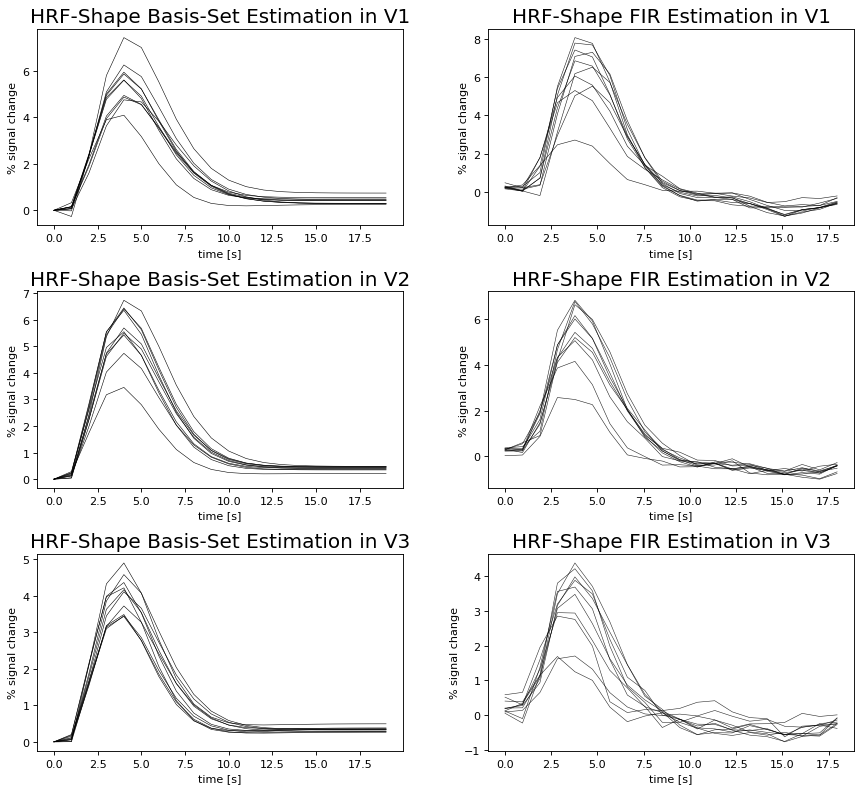

In [93]:
# Then plot it only for the stimulus
from matplotlib.pyplot import figure

figure(figsize=(11, 10), dpi=80)
plt.subplot(3,2,1)
plot_time_course_task4({"Stim1": yhatStimV1[0], "Stim2": yhatStimV1[1], "Stim3": yhatStimV1[2],"Stim4": yhatStimV1[3],"Stim5": yhatStimV1[4],"Stim6": yhatStimV1[5],"Stim7": yhatStimV1[6],"Stim8": yhatStimV1[7],"Stim9": yhatStimV1[8],"Stim10": yhatStimV1[9],}, 
                 {'stimulus': onsetEvent.astype(int)}, title = "HRF-Shape Basis-Set Estimation in V1")
plt.subplot(3,2,2)
plot_responsive_vertex_all_task4(rsq_task2, betas_task2, mask=mask_v1_task4_FIR[0], n_timepoints=20, title = "HRF-Shape FIR Estimation in V1")
plt.subplot(3,2,3)
plot_time_course_task4({"Stim1": yhatStimV2[0], "Stim2": yhatStimV2[1], "Stim3": yhatStimV2[2],"Stim4": yhatStimV2[3],"Stim5": yhatStimV2[4],"Stim6": yhatStimV2[5],"Stim7": yhatStimV2[6],"Stim8": yhatStimV2[7],"Stim9": yhatStimV2[8],"Stim10": yhatStimV2[9],}, 
                 {'stimulus': onsetEvent.astype(int)}, title = "HRF-Shape Basis-Set Estimation in V2")
plt.subplot(3,2,4)
plot_responsive_vertex_all_task4(rsq_task2, betas_task2, mask=mask_v2_task4_FIR[0], n_timepoints=20, title = "HRF-Shape FIR Estimation in V2")
plt.subplot(3,2,5)
plot_time_course_task4({"Stim1": yhatStimV3[0], "Stim2": yhatStimV3[1], "Stim3": yhatStimV3[2],"Stim4": yhatStimV3[3],"Stim5": yhatStimV3[4],"Stim6": yhatStimV3[5],"Stim7": yhatStimV3[6],"Stim8": yhatStimV3[7],"Stim9": yhatStimV3[8],"Stim10": yhatStimV3[9],}, 
                 {'stimulus': onsetEvent.astype(int)}, title = "HRF-Shape Basis-Set Estimation in V3")
plt.subplot(3,2,6)
plot_responsive_vertex_all_task4(rsq_task2, betas_task2, mask=mask_v3_task4_FIR[0], n_timepoints=20, title = "HRF-Shape FIR Estimation in V3")
plt.tight_layout()


In [94]:

# Comparing the r-squared values
bestrsqFIR = np.concatenate((rsq_task2[mask_v1_task4_FIR[0]], rsq_task2[mask_v2_task4_FIR[0]], rsq_task2[mask_v3_task4_FIR[0]]))
bestrsqBasisSet = np.concatenate((rsq_task4[indV1], rsq_task4[indV2], rsq_task4[indV3]))
print("The r-squared values of the 30 best fitted voxels using the FIR model range from {} to {}.".format(round(min(bestrsqFIR), 2), round(max(bestrsqFIR),2)) )
print("The r-squared values of the 30 best fitted voxels using the basis set range from {} to {}.".format(round(min(bestrsqBasisSet),2), round(max(bestrsqBasisSet), 2)))


The r-squared values of the 30 best fitted voxels using the FIR model range from 0.82 to 0.9.
The r-squared values of the 30 best fitted voxels using the basis set range from 0.64 to 0.75.


#Exploring the haemodynamic response function(s) in the visual cortex with 7T data
*(Project 3: Haemodynamic Response Mapper)*



# Abstract

In the present study, the haemodynamic response function (HRF) in the visual cortex was investigated in detail. In a simple experiment, full-screen flickering checkerboard stimuli were presented and functional MRI data were collected in a 7 Tesla scanner. In addition, eye-tracking data were collected to be included in the analysis. The difference in HRF between visual areas V1, V2, and V3 was investigated. Furthermore, it was investigated whether the addition of nuisance regressors changed the HRF and whether a higher temporal resolution of the data revealed further details. All analyses were based on a finite impulse response (FIR) model, which was finally compared with a basic standard set. The prototypical HRF was found to differ between visual areas, although the addition of nuisance regressors seemed to have little effect on the estimated shape. A higher temporal resolution also showed only minor changes in HRF. Comparing the FIR model with a standard basis set showed that the predicted HRFs are somewhat similar, but the standard basis set neglects individual differences in HRFs. 

# Introduction

Over the recent years many efforts have been made to increase the spatial resolution of brain imaging. Such research focused particularly on functional magnetic resonance imaging (fMRI) at high field strengths such as 7T (Kraff and Quick, 2017). As we increase the spatial resolution of our methods, however, we need to question assumptions about the haemodynamic response and account for other factors that might influence it. Consider, for instance, the large draining veins confound: as we increase our spatial resolution our BOLD signal becomes increasingly confounded with responses from large draining veins (Kay et al., 2020). These effects may reflect neural activity from original sites that might be displaced as much as 4mm and pooled neural responses over larger brain areas leading to a decrease in spatial specificity (Turner, 2002). In summary, the more fine grained our spatial resolution becomes, the more we have to question the assumptions we hold about the BOLD signal.  

Faster electrophysiological signals, such as electroencephalograms, can make use of simple epoch averaging in order to disentangle effects of different behavioural events (Mouraux & Iannetti, 2008). Here we select a time frame spanning the onset of the event of interest and 20 subsequent seconds. We then take the average of every time this event occurred to estimate the average response to the event. The problem with applying this to BOLD signals, however, is that the signal is slower and therefore more susceptible to contamination: the epochs might contain signals that relate to behavioural events that are close together in time. This way, these signal might be counted twice in our analysis leading to problems.  

An analysis method that overcomes the contamination problem and allows us to disentangle overlapping responses is deconvolution (Burock & Dale, 2000). Here we assume a linear time-invariant system, meaning that we assume overlapping responses at any given time-point add up linearly. As a result, we can disentangle the responses as if we would resolve a linear system. We can do this by using a general linear model (GLM) to fit a Finite Impulse Response (FIR) model, which will allow us to estimate the response generated after an event at a series of time-points. This yields a design matrix that we can use to estimate a number of regressors that reflect different post-event time-points. The signal variance will thus be distributed between the different regressors, which will allow us to estimate which neural responses were convolved in order to produce our signal.
In this experiment, we try to map the BOLD response in the visual cortex, using data that was obtained by presenting flickering checkboard stimuli to our beloved subject (Tomas). The invervals between the presentations were drawn randomly from an exponential function, as this was shown to be ideal for the estimation of the haemodynamic response function's (HRF) shape (Burock & Dale, 2000). 


# Methods

**Preprocessing:**

In the experiment, the whole brain was scanned. The already coregistered raw data were first examined for slow drifts using a Fourier transformation. Existing drifts would have been eliminated by high-pass filtering of the data, with 0.01 Hz specified as the cut-off value. Accordingly, any oscillation slower than 100 seconds would have been removed from the signal. However, since co-collected drift regressors were also available for analysis, the unfiltered data were used to avoid correcting any possible drift several times.
In addition, the data were examined for possible spikes. Since such artefacts would have to appear in all vertices, the mean global signal was examined for outliers across all brain areas. The global signal was z-standardised and a value of 5 standard deviations was set as the threshold value. Spikes found would have received their own regressor for this time point in the design matrices of the generalised linear models set up in the following. For the further analysis, percent signal changed data were used unless specified differently. 

**Task 1**

In order to better estimate the haemodynamic response function, in addition to the stimulus presentation, eye movement and blink data obtained from the eye tracking collected in parallel were also used in the analysis of the activity in the visual cortex. For this purpose, all three predictors were rounded to the nearest repetition times (TR) and, for an exact estimation of the time course, the 20 following time points were included as individual regressors in the design matrix within the framework of a finite impulse response model for deconvolution. It was taken into account that no responses were fitted whose following 20 time points exceeded the total length of the collected data. For the voxels best explained by this model in V1, V2, and V3, the predicted time courses of all three predictors were mapped. In addition, the average time course of the predicted response in all three areas was shown, with 95% confidence intervals indicated by shaded areas around the mean course.

**Task 2**

Further slow drift and nuisance regressors were included in the analysis in order to investigate to what extent this further variance elucidation could lead to a better estimation of the time courses. For this purpose, a total of 21 additional regressors were added to the design matrix. To avoid leaps in the values of these regressors, missing values were estimated by the nearest available values in time. Then the procedure from task 1 was repeated. In addition, the t-statistics in all voxels were calculated for a number of nuisance regressors and their absolute values were mapped on a flat map in order to check to what extent they correspond to the brain areas best explained by the model.

**Task 3**

To capture the HRF with higher temporal precision, the data were "harmonised" by a factor of 3, resulting in a new artificial TR of 1/3 of the original, effectively increasing the temporal resolution of our analysis by a factor of 3. A new design matrix was then created to account for the new temporal resolution. Therefore, 60 time points after an event were now considered. Further, the analysis of Task 2 was repeated.

**Task 4**

In the last analysis, a temporal basis set was used to estimate the HRF shape in order to compare the results to the estimations that the FIR model yields. In this analysis we use a single gamma function, its time derivative and its dispersion derivative to account for differences in the lag and the width of the HRF shape.  
To do so, each of the three event predictors was convolved with the temporal basis functions yielding 9 predictors that we stacked together with an intercept for our design matrix. The ten best fitting voxels in V1,V2 and V3 were displayed and their HRF shapes compared to the ones obtained vie the full FIR model. To retrieve these shape estimates, we build event arrays that had one event onset at the first second, followed by no events for the next 19 seconds. Specifically, we modeled a single onset for the stimulus, and no onset for saccades and blinks. We then convolved them again with our basis set to create a design matrix that we multiply with our previously yielded betas to gain estimations of our HRF-shape that can be readily plotted.




# Results

**Preprocessing** 

The raw data were neither percent signal changed nor z-scored. Furthermore, they were not high-pass filtered. In the investigation of possible spikes, no time point reached the defined threshold, so no particular signal fluctuations were considered in the following analyses.

**Task 1 and 2**

The addition of blinks and eye movements better disentangled the HRF from these influences. The HRF looks generally very prototypical in all three areas, although the exact time courses differ between the areas. When looking at the best fitting voxels, the BOLD response seems to have the strongest amplitude at the surface in V1 and a somewhat broader peak than in V2 and V3. It also shows that the saccade time course varies more and seems to have more influence on the signal than the blinks. 
After including more slow drift and nuisance regressors in the analysis, the predicted time courses were compared with those of the simpler analysis. This showed that the HRF responses seem to differ only marginally from each other when adding the nuisance regressors. 
The time course for the best fitting voxels in V1, V2, and V3 can be seen in the next plot of the estimated HRF according to the model that also included the nuisance regressors.


3 responsive voxels detected in the region
3 responsive voxels detected in the region
3 responsive voxels detected in the region


Text(3.8, 3.6, 'V3')

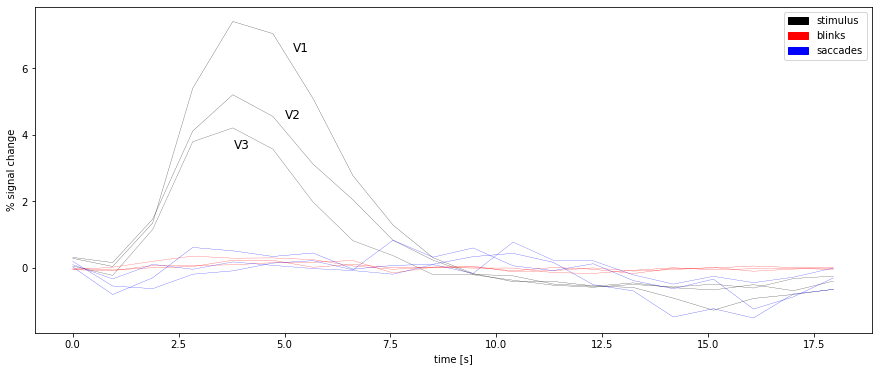

In [95]:
plt.figure(figsize=(15, 6))
plot_responsive_vertex_all(rsq_task2, 
                           betas=betas_task2, 
                           mask=best_rsq_mask_comb)
plt.text(5.2, 6.5, "V1", fontsize=12)
plt.text(5, 4.5, "V2", fontsize=12)
plt.text(3.8, 3.6, "V3", fontsize=12)

The findings from the comparison of the best-fit voxels are supported both in terms of the differences between areas V1, V2, and V3, and in terms of the small differences caused by the addition of the nuisance regressors. 
One difference between the two models, however, is that the estimated HRF responses in the model that takes into account the nuisance regressors have a smaller amplitude and are estimated somewhat lower. However, the pure form is very similar in both analyses. 



Plotting the t-statistics of various confounding variables showed partial correlation between these and the brain regions best predicted by the model. However, there was no particular correlation with task-relevant activity in the visual cortex. The disturbance signals seem to be rather non-specific. This also corresponds to the finding that the HRF estimation seems to be barely affected by the addition of the nuisance regressors. 

**Task 3**



It is noticeable that the shape of the BOLD response is different. The original data produced a much smoother stimulus response than the harmonica data. This step-like shape is to be expected as we used a reapeater function to increase our original data as well as the perturbation data repeating the same values three times. Comparable to the earlier results, we still see that the amplitude of the stimulus response decreases as we move from V1 to V2 to V3 when we look only at the harmonica data. The estimated HRF of the best fitting voxels can be seen in the next figure.

3 responsive voxels detected in the region
3 responsive voxels detected in the region
3 responsive voxels detected in the region


Text(11.4, 3.6, 'V3')

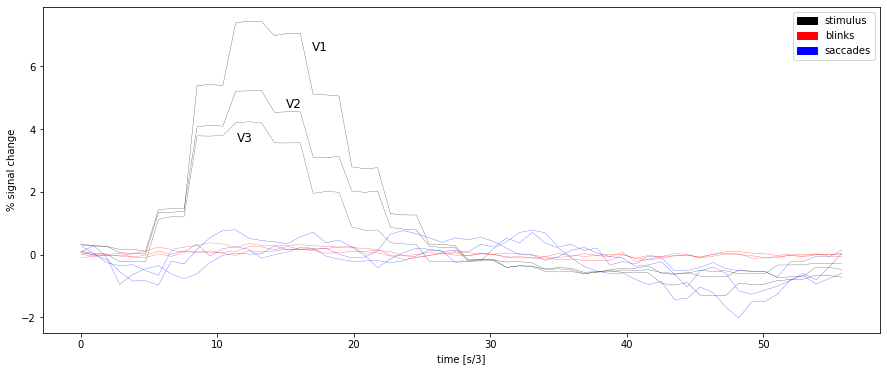

In [96]:
plt.figure(figsize=(15, 6))
plot_responsive_vertex_all(rsq_task3, 
                           betas=betas_task3, 
                           mask=best_rsq_mask_comb, n_timepoints=60, xlabel = "time [s/3]")
plt.text(16.9, 6.5, "V1", fontsize=12)
plt.text(15, 4.7, "V2", fontsize=12)
plt.text(11.4, 3.6, "V3", fontsize=12)

**Task 4**



Both models assume that the peak response is around 4-5 seconds, with a small initial dip within the first two seconds after stimulus presentation. The estimated HRF responses are also quite similar, but it is clear that the FIR model allows greater flexibility in the individual modelling of the HRF and that these also deviate in part from the specifications of the standard basis function. This also explains why the variance explained in the FIR model is higher than in the standard basis function model. A comparison of the two models for the best 10 voxels in V1, V2, and V3 can be seen in the next figure. 

10 responsive voxels detected in the region
10 responsive voxels detected in the region
10 responsive voxels detected in the region


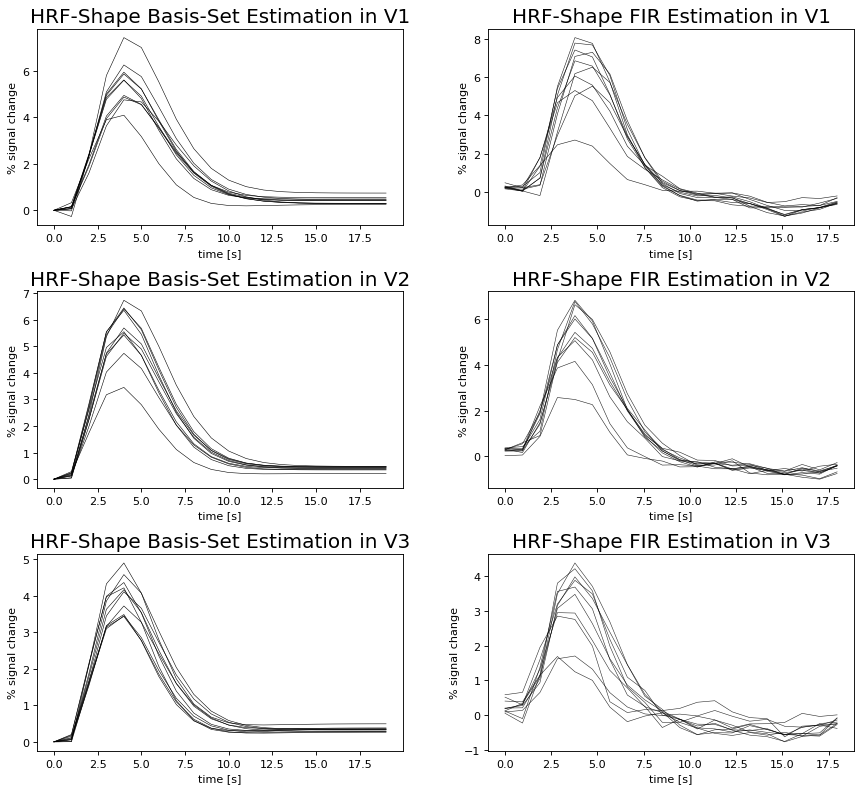

In [97]:
figure(figsize=(11, 10), dpi=80)
plt.subplot(3,2,1)
plot_time_course_task4({"Stim1": yhatStimV1[0], "Stim2": yhatStimV1[1], "Stim3": yhatStimV1[2],"Stim4": yhatStimV1[3],"Stim5": yhatStimV1[4],"Stim6": yhatStimV1[5],"Stim7": yhatStimV1[6],"Stim8": yhatStimV1[7],"Stim9": yhatStimV1[8],"Stim10": yhatStimV1[9],}, 
                 {'stimulus': onsetEvent.astype(int)}, title = "HRF-Shape Basis-Set Estimation in V1")
plt.subplot(3,2,2)
plot_responsive_vertex_all_task4(rsq_task2, betas_task2, mask=mask_v1_task4_FIR[0], n_timepoints=20, title = "HRF-Shape FIR Estimation in V1")
plt.subplot(3,2,3)
plot_time_course_task4({"Stim1": yhatStimV2[0], "Stim2": yhatStimV2[1], "Stim3": yhatStimV2[2],"Stim4": yhatStimV2[3],"Stim5": yhatStimV2[4],"Stim6": yhatStimV2[5],"Stim7": yhatStimV2[6],"Stim8": yhatStimV2[7],"Stim9": yhatStimV2[8],"Stim10": yhatStimV2[9],}, 
                 {'stimulus': onsetEvent.astype(int)}, title = "HRF-Shape Basis-Set Estimation in V2")
plt.subplot(3,2,4)
plot_responsive_vertex_all_task4(rsq_task2, betas_task2, mask=mask_v2_task4_FIR[0], n_timepoints=20, title = "HRF-Shape FIR Estimation in V2")
plt.subplot(3,2,5)
plot_time_course_task4({"Stim1": yhatStimV3[0], "Stim2": yhatStimV3[1], "Stim3": yhatStimV3[2],"Stim4": yhatStimV3[3],"Stim5": yhatStimV3[4],"Stim6": yhatStimV3[5],"Stim7": yhatStimV3[6],"Stim8": yhatStimV3[7],"Stim9": yhatStimV3[8],"Stim10": yhatStimV3[9],}, 
                 {'stimulus': onsetEvent.astype(int)}, title = "HRF-Shape Basis-Set Estimation in V3")
plt.subplot(3,2,6)
plot_responsive_vertex_all_task4(rsq_task2, betas_task2, mask=mask_v3_task4_FIR[0], n_timepoints=20, title = "HRF-Shape FIR Estimation in V3")
plt.tight_layout()

## Discussion

*   What have we learned? 
*   What should others be aware of? 
*   In what sense do your findings correspond to the literature you know, and in what sense do your findings deviate from the canon? 

What have you learned?

Feel free to add references that you've stumbled upon yourselves. 